# Rolling Planning mit Lateness (Tardiness + Earliness)

In [2]:
max_time = 60*30 # 1/2h

notebook_prefix = "10"

In [3]:
import time

from ortools.sat.python import cp_model
import pandas as pd
import numpy as np
import math

pd.set_option('display.max_rows', 20)


import utils.presenter as show
import utils.checker as check

import utils.scheduling_solver as ssv
import utils.rescheduling_solver_lateness as rssv

import utils.rolling_planning.init_jobs_times as rp_init
import utils.rolling_planning.procedure as rp_proced
import utils.schedule_deadline as deadline_gen

from ProductionDaySimulation import ProductionDaySimulation

In [4]:
start_notebook = time.time()

In [5]:
def get_schedule_filename(prefix: str = "", day: int = 0, data_txt: str = "schedule", suffix: str = "") -> str:
    file_template = "data/{prefix}_{data}_{day:02d}{suffix}.csv"
    if suffix:
        suffix = f"_{suffix}"
    return file_template.format(prefix=prefix,data=data_txt,day=day, suffix=suffix)

## Laden des Datensatzes für 17 Tage (15 Ankunftstage)

In [7]:
df_jssp = pd.read_csv('data/09_jssp_for_17_days.csv')
df_jssp

,Job,Operation,Machine,Processing Time
0,Job_000,0,M0,29
1,Job_000,1,M1,78
2,Job_000,2,M2,9
3,Job_000,3,M3,36
4,Job_000,4,M4,49
...,...,...,...,...
3225,Job_322,5,M9,76
3226,Job_322,6,M5,47
3227,Job_322,7,M3,52
3228,Job_322,8,M4,90


In [8]:
df_times = pd.read_csv('data/09_times_scattered_deadlines_for_17_days.csv')
df_times

,Job,Arrival,Deadline
0,Job_000,0.00,792.0
1,Job_001,82.55,1593.0
2,Job_002,143.24,1682.0
3,Job_003,194.98,1784.0
4,Job_004,231.20,1749.0
...,...,...,...
318,Job_318,24156.49,26360.0
319,Job_319,24162.49,24892.0
320,Job_320,24163.83,25883.0
321,Job_321,24281.32,25603.0


In [9]:
# Deadlines + Umwandlung in Integer
df_times["Arrival"] = np.floor(df_times["Arrival"]).astype(int)
df_times["Deadline"] = np.ceil(df_times["Deadline"]).astype(int)
df_times

,Job,Arrival,Deadline
0,Job_000,0,792
1,Job_001,82,1593
2,Job_002,143,1682
3,Job_003,194,1784
4,Job_004,231,1749
...,...,...,...
318,Job_318,24156,26360
319,Job_319,24162,24892
320,Job_320,24163,25883
321,Job_321,24281,25603


## Params

In [11]:
# fix
day_length = 1440
horizon_days = 3

In [12]:
# init
day_numb = 0

day_start = 0
day_end = 0
planning_end = 0

# Initialisierung (Tag 0)

In [14]:
day_numb = 0

day_start = day_length*day_numb                      # 0
day_end = day_start + day_length                     # 1440
planning_end =  day_start + horizon_days*day_length  # 4320

In [15]:
# I)
df_jssp_curr, df_times_curr = rp_proced.filter_jobs_by_arrival_window(df_times, df_jssp, day_start, planning_end)
df_jssp_curr

,Job,Operation,Machine,Processing Time
0,Job_000,0,M0,29
1,Job_000,1,M1,78
2,Job_000,2,M2,9
3,Job_000,3,M3,36
4,Job_000,4,M4,49
...,...,...,...,...
565,Job_056,5,M9,76
566,Job_056,6,M5,47
567,Job_056,7,M3,52
568,Job_056,8,M4,90


In [16]:
df_times_curr 

,Job,Arrival,Deadline
0,Job_000,0,792
1,Job_001,82,1593
2,Job_002,143,1682
3,Job_003,194,1784
4,Job_004,231,1749
...,...,...,...
52,Job_052,3996,6613
53,Job_053,4002,4805
54,Job_054,4003,5718
55,Job_055,4121,5427


### Scheduling

In [18]:
starting_time = time.time()

# Scheduling
df_plan = ssv.solve_cp_jssp_lateness_by_tardiness_and_earliness(df_jssp_curr, df_times_curr,
                                                                w_t = 5,
                                                                msg=False, timeLimit=max_time, gapRel= 0.00)
df_plan

# Informationen
ending_time = time.time()
solver_duration = ending_time - starting_time
print(f"\nScheduling-Dauer: {int(solver_duration // 60)} Minuten und {(solver_duration % 60):.2f} Sekunden.")
df_plan


Solver-Status         : OPTIMAL
Objective Value       : 128.00
Best Objective Bound  : 128.00
Laufzeit              : 9.62 Sekunden

Scheduling-Dauer: 0 Minuten und 9.69 Sekunden.


,Job,Operation,Arrival,Deadline,Machine,Start,Processing Time,End,Lateness,Tardiness,Earliness
0,Job_000,0,0,792,M0,0,29,29,-763,0,763
1,Job_000,1,0,792,M1,29,78,107,-685,0,685
2,Job_001,0,82,1593,M0,82,43,125,-1468,0,1468
3,Job_000,2,0,792,M2,107,9,116,-676,0,676
4,Job_000,3,0,792,M3,116,36,152,-640,0,640
...,...,...,...,...,...,...,...,...,...,...,...
565,Job_048,9,3716,5489,M3,5410,79,5489,0,0,0
566,Job_051,9,3991,5459,M7,5434,25,5459,0,0,0
567,Job_054,9,4003,5718,M4,5685,33,5718,0,0,0
568,Job_056,9,4220,6028,M7,5983,45,6028,0,0,0


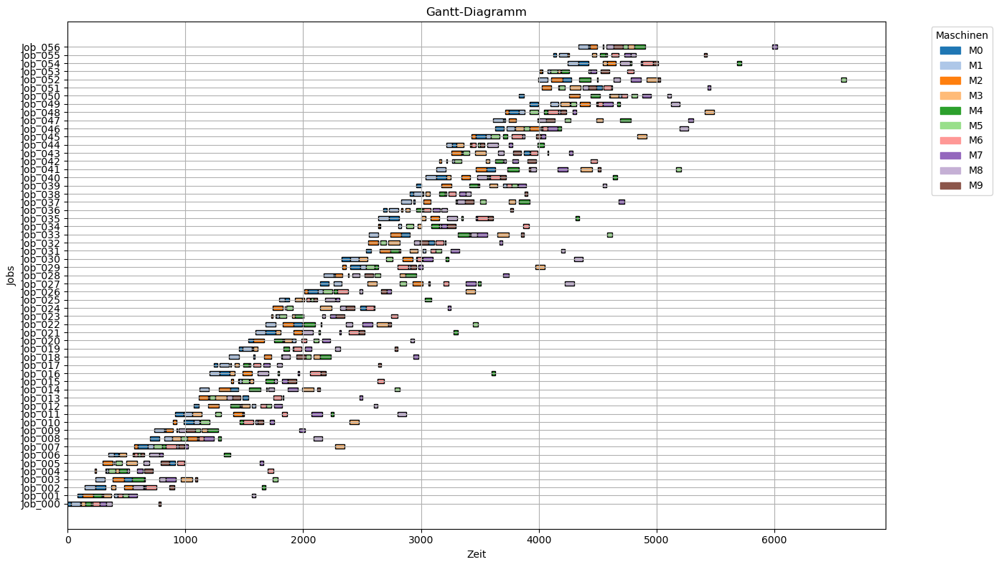

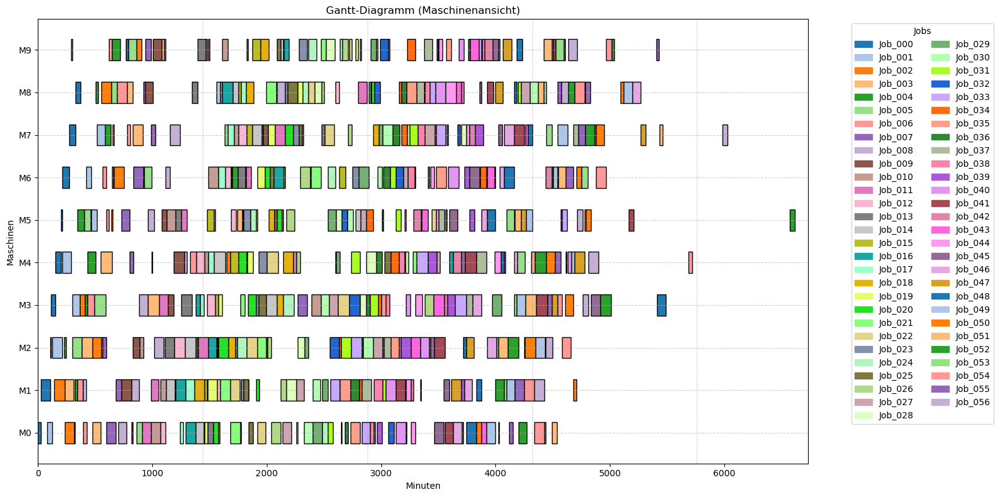

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job


True

In [19]:
show.plot_gantt_jobs(df_plan)
show.plot_gantt_machines(df_plan)

check.is_machine_conflict_free(df_plan)
check.is_operation_sequence_correct(df_plan)
check.is_job_timing_correct(df_plan)
check.is_start_correct(df_plan)

In [20]:
last_ops = df_plan.sort_values(['Job', 'Operation']).drop_duplicates('Job', keep='last')
show.count_column_grouped(last_ops, "Lateness", max_val = 90, steps= 30)

label
<-90          0
-90 - -60     0
-60 - -30     2
-30 - 0       2
0            53
0 - 30        0
30 - 60       0
60 - 90       0
>90           0
Name: count, dtype: int32

### Simulation

In [22]:
simulation = ProductionDaySimulation(df_plan, vc=0.35)
df_execution, df_undone = simulation.run(start_time = day_start, end_time=day_end)

[00:00:00] Job_000 started on M0
[00:32:49] Job_000 finished on M0 (after 32 minutes 50 seconds)
[00:32:49] Job_000 started on M1
[01:22:00] Job_001 started on M0
[02:38:05] Job_000 finished on M1 (after 125 minutes 16 seconds)
[02:38:05] Job_002 started on M1
[02:38:05] Job_000 started on M2
[02:44:22] Job_000 finished on M2 (after 06 minutes 17 seconds)
[02:44:22] Job_000 started on M3
[02:46:52] Job_001 finished on M0 (after 84 minutes 53 seconds)
[02:46:52] Job_001 started on M2
[03:14:33] Job_000 finished on M3 (after 30 minutes 11 seconds)
[03:14:33] Job_000 started on M4
[03:50:10] Job_000 finished on M4 (after 35 minutes 37 seconds)
[03:50:10] Job_000 started on M5
[03:51:49] Job_001 finished on M2 (after 64 minutes 57 seconds)
[03:51:49] Job_004 started on M2
[03:51:49] Job_001 started on M4
[04:03:29] Job_000 finished on M5 (after 13 minutes 19 seconds)
[04:03:29] Job_000 started on M6
[04:22:58] Job_004 finished on M2 (after 31 minutes 09 seconds)
[04:52:07] Job_002 finished

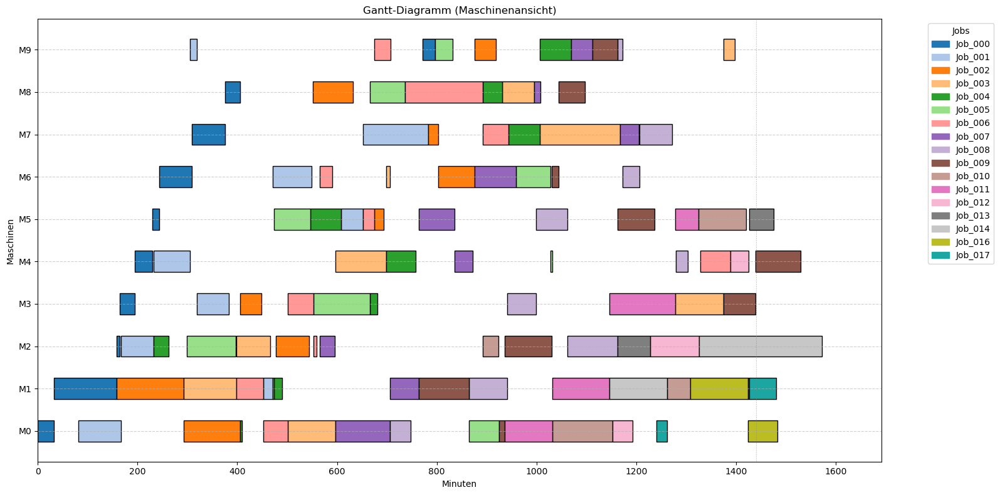

In [23]:
if not df_execution.empty:
    show.plot_gantt_machines(df_execution, duration_column="Simulated Processing Time")
else:
    print(f"Nothing executed on day {day_numb}")

In [24]:
df_undone

,Job,Operation,Arrival,Machine,Planned Start,Processing Time
0,Job_013,3,1111,M3,1254,95
1,Job_013,4,1111,M8,1349,48
2,Job_018,0,1340,M1,1371,85
3,Job_016,2,1123,M3,1378,39
4,Job_014,2,1116,M0,1380,71
...,...,...,...,...,...,...
453,Job_048,9,3716,M3,5410,79
454,Job_051,9,3991,M7,5434,25
455,Job_054,9,4003,M4,5685,33
456,Job_056,9,4220,M7,5983,45


In [25]:
df_undone.sort_values(by="Arrival")

,Job,Operation,Arrival,Machine,Planned Start,Processing Time
27,Job_001,9,82,M8,1563,30
40,Job_002,9,143,M4,1649,33
52,Job_003,9,194,M5,1741,43
48,Job_004,9,231,M6,1696,53
38,Job_005,9,299,M7,1634,25
...,...,...,...,...,...,...
439,Job_056,8,4220,M4,4812,90
431,Job_056,6,4220,M5,4713,47
412,Job_056,3,4220,M6,4543,7
396,Job_056,2,4220,M2,4437,61


In [26]:
df_plan.to_csv(get_schedule_filename(notebook_prefix, day=day_numb, suffix="init"), index = False)

In [27]:
df_plan_init = df_plan
df_execution_init = df_execution
df_undone_init = df_undone

## A) Rolling Planning Simple

**Zielfunktion:**

Minimiere die gewichtete Summe aus Tardiness und Earliness der Jobs:

\\[
Z(\sigma) = \sum_{j} \left( w_t \cdot \text{Tardiness}_j + w_e \cdot \text{Earliness}_j \right)
\\]

wobei:

- \\( w_t \in \mathbb{N},\ w_e \in \mathbb{N} \\): Gewicht für Tardiness und Earliness  
- \\( \text{Tardiness}_j = \max(0, C_j - d_j) \\), \\( \text{Earliness}_j = \max(0, d_j - C_j) \\)  
    - \\( C_j \\): Fertigstellungszeitpunkt der letzten Operation von Job \\( j \\)  
    - \\( d_j \\): Deadline für Job \\( j \\)


Solver-Status         : OPTIMAL
Objective Value       : 152.00
Best Objective Bound  : 152.00
Laufzeit              : 23.48 Sekunden

  Scheduling-Dauer: 0 Minuten und 23.84 Sekunden.


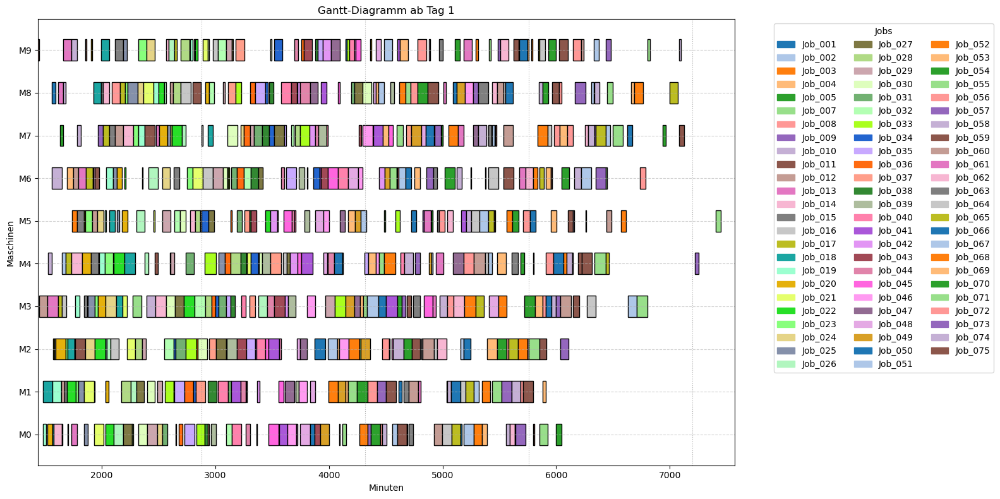

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0         5
0              69
0 - 60          0
60 - 120        0
120 - 180       0
>180            0
Name: count, dtype: int32
[24:00:00] Job_012 started on M9
[24:20:37] Job_012 finished on M9 (after 20 minutes 38 seconds)
[24:20:37] Job_012 started on M3
[24:41:00] Job_018 started on M1
[24:43:00] Job_019 started on M0
[25:17:32] Job_019 finished on M0 (after 34 minutes 32 seconds)
[25:22:00] Job_020 started on M0
[25:30:00] Job_010 started on M4
[25:37:13] Job_012 finished on M3 (after 76 minutes 36 seconds)
[25:37:13] Job_013 started on M3
[25:50:37] Job_010 finished on M4 (after 20 minutes 38 seconds)
[26:01:00] Job_020 finished on M0 (after 39 minutes)
[26:02:00] Job_010

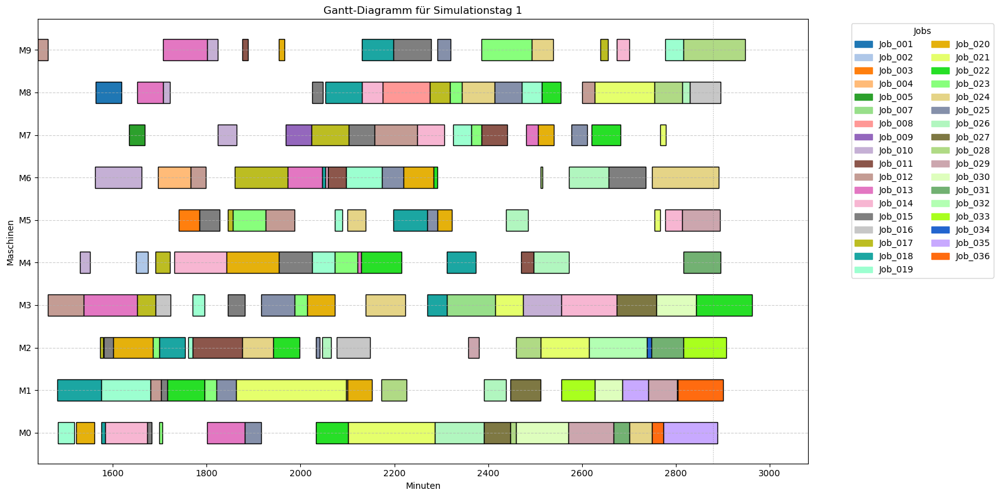


Solver-Status         : OPTIMAL
Objective Value       : 1567.00
Best Objective Bound  : 1567.00
Laufzeit              : 38.81 Sekunden

  Scheduling-Dauer: 0 Minuten und 39.22 Sekunden.


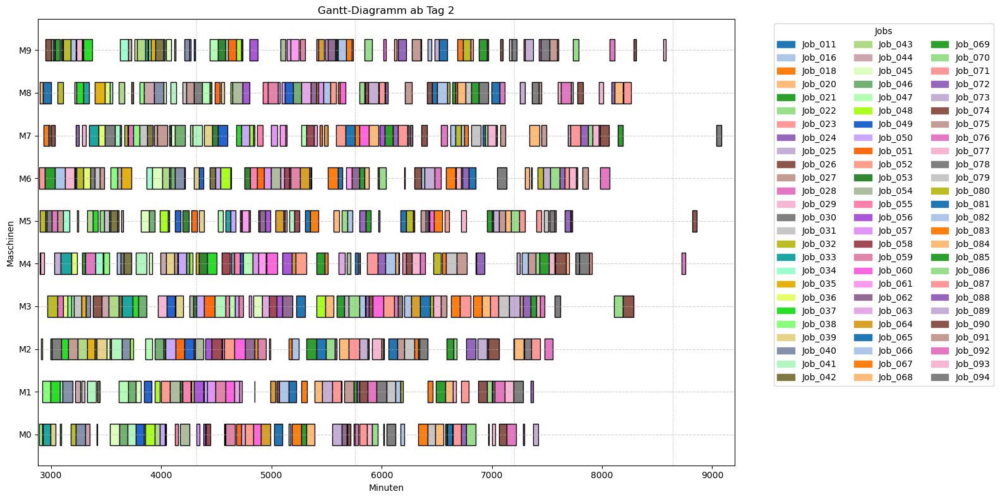

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0         9
0              67
0 - 60          0
60 - 120        0
120 - 180       2
>180            0
Name: count, dtype: int32
[48:09:00] Job_038 started on M0
[48:12:00] Job_023 started on M6
[48:15:00] Job_032 started on M5
[48:16:00] Job_020 started on M8
[48:16:00] Job_024 started on M4
[48:21:31] Job_024 finished on M4 (after 05 minutes 32 seconds)
[48:22:00] Job_029 started on M4
[48:29:00] Job_036 started on M2
[48:33:24] Job_038 finished on M0 (after 24 minutes 24 seconds)
[48:38:00] Job_034 started on M0
[48:38:00] Job_038 started on M1
[48:40:28] Job_036 finished on M2 (after 11 minutes 29 seconds)
[48:46:25] Job_034 finished on M0 (after 08 minutes 26 seconds)
[48:4

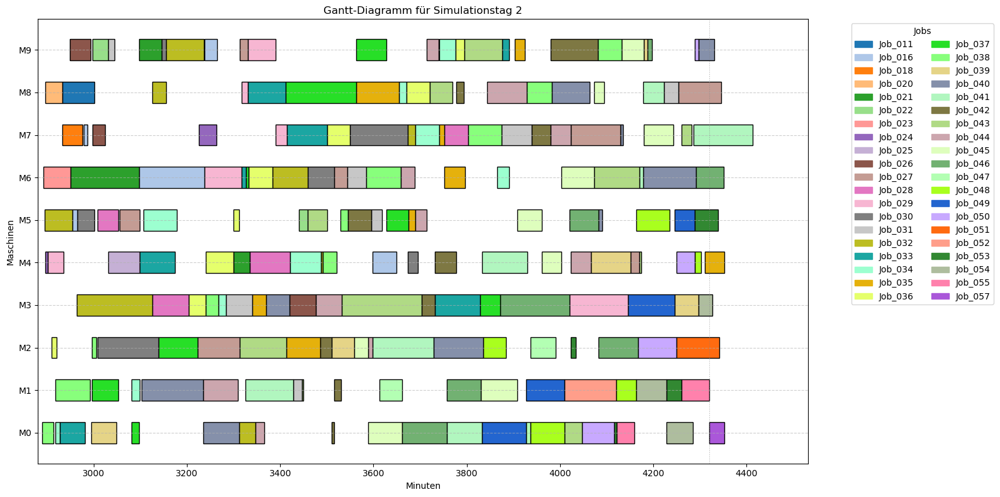


Solver-Status         : OPTIMAL
Objective Value       : 430.00
Best Objective Bound  : 430.00
Laufzeit              : 35.32 Sekunden

  Scheduling-Dauer: 0 Minuten und 35.72 Sekunden.


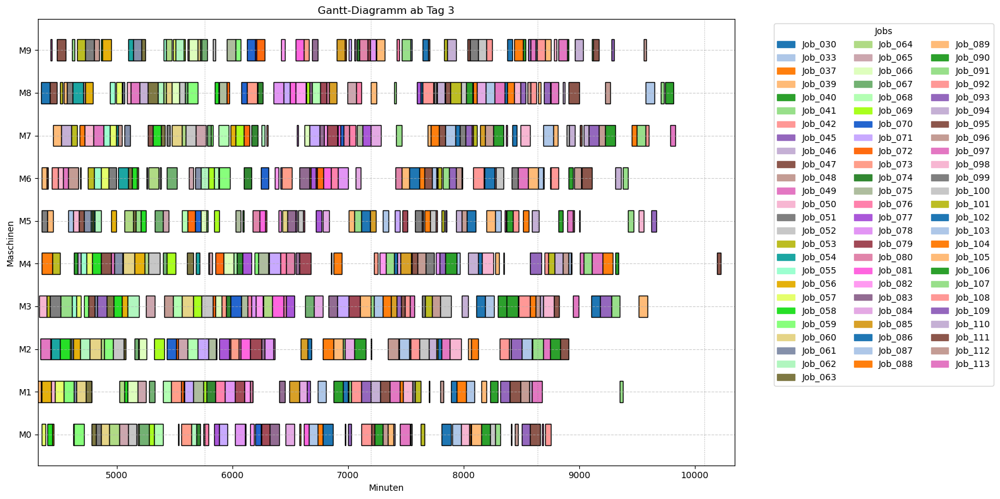

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0         7
0              68
0 - 60          1
60 - 120        0
120 - 180       0
>180            0
Name: count, dtype: int32
[72:01:00] Job_039 started on M1
[72:08:00] Job_050 started on M3
[72:18:25] Job_039 finished on M1 (after 17 minutes 26 seconds)
[72:22:00] Job_049 started on M2
[72:27:00] Job_030 started on M8
[72:29:00] Job_051 started on M1
[72:31:01] Job_051 finished on M1 (after 02 minutes 01 second)
[72:31:01] Job_056 started on M1
[72:31:01] Job_051 started on M5
[72:32:00] Job_039 started on M6
[72:33:00] Job_037 started on M4
[72:34:00] Job_057 started on M0
[72:58:23] Job_057 finished on M0 (after 24 minutes 23 seconds)
[73:13:26] Job_050 finished on M3 (af

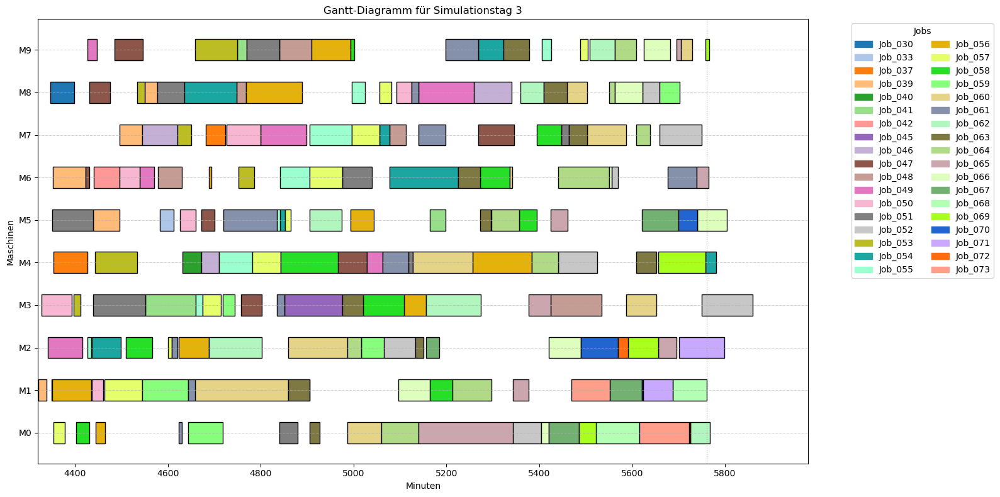


Solver-Status         : OPTIMAL
Objective Value       : 131.00
Best Objective Bound  : 131.00
Laufzeit              : 22.76 Sekunden

  Scheduling-Dauer: 0 Minuten und 23.17 Sekunden.


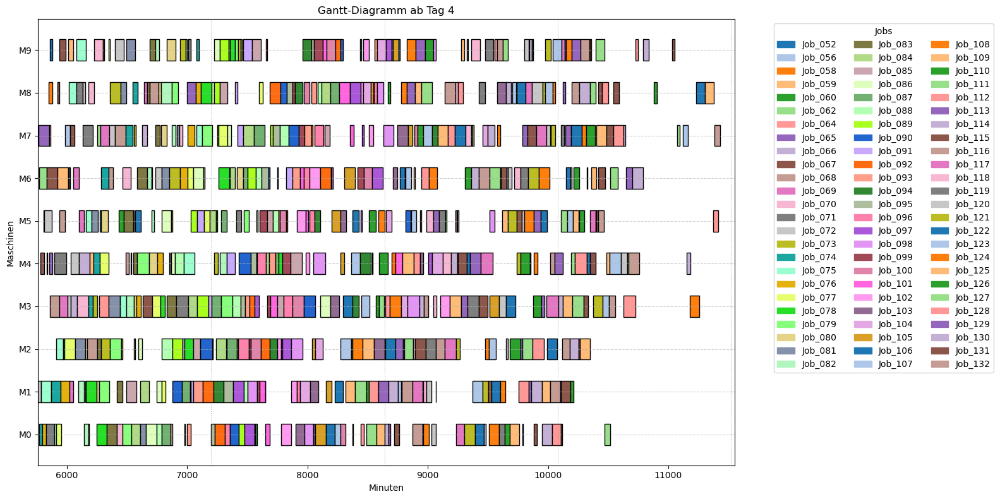

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0         6
0              69
0 - 60          0
60 - 120        0
120 - 180       0
>180            0
Name: count, dtype: int32
[96:01:00] Job_072 started on M1
[96:05:00] Job_065 started on M7
[96:08:00] Job_062 started on M6
[96:08:00] Job_074 started on M0
[96:21:00] Job_067 started on M4
[96:22:49] Job_072 finished on M1 (after 21 minutes 49 seconds)
[96:23:00] Job_075 started on M1
[96:36:49] Job_074 finished on M0 (after 28 minutes 49 seconds)
[96:37:00] Job_076 started on M0
[96:41:18] Job_067 finished on M4 (after 20 minutes 18 seconds)
[96:44:00] Job_059 started on M5
[96:52:26] Job_059 finished on M5 (after 08 minutes 27 seconds)
[96:54:00] Job_072 started on M5
[96:5

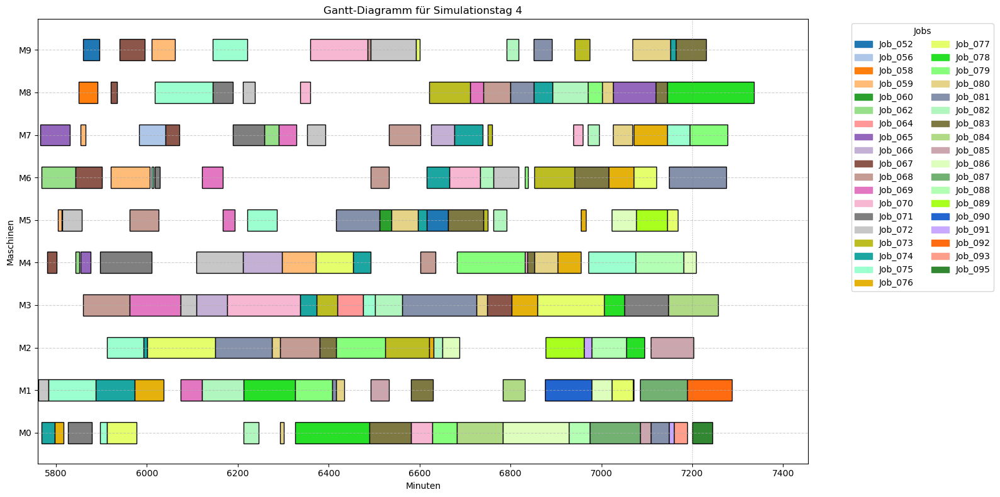


Solver-Status         : OPTIMAL
Objective Value       : 4913.00
Best Objective Bound  : 4913.00
Laufzeit              : 26.10 Sekunden

  Scheduling-Dauer: 0 Minuten und 26.60 Sekunden.


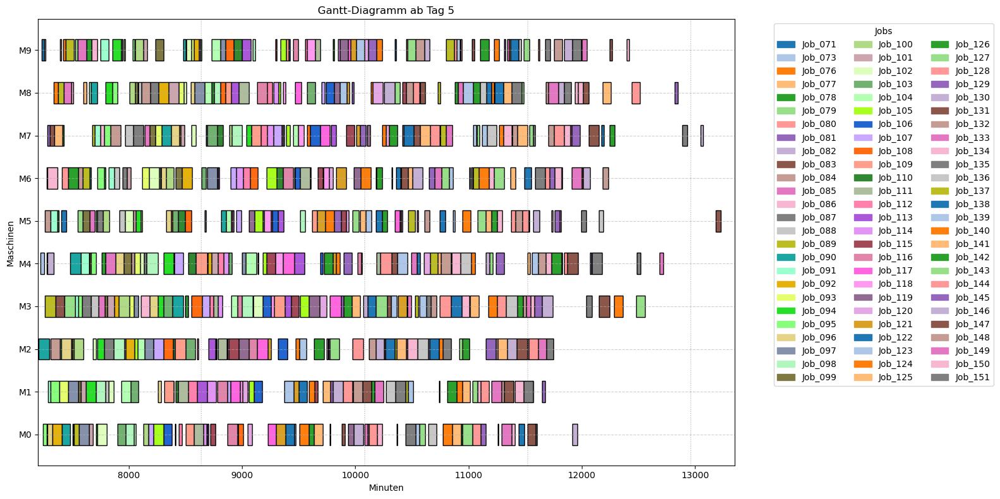

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0         4
0              70
0 - 60          1
60 - 120        1
120 - 180       0
>180            2
Name: count, dtype: int32
[120:03:00] Job_090 started on M2
[120:23:00] Job_073 started on M4
[120:31:00] Job_071 started on M9
[120:46:00] Job_095 started on M0
[120:51:33] Job_071 finished on M9 (after 20 minutes 34 seconds)
[120:53:00] Job_088 started on M9
[120:53:32] Job_073 finished on M4 (after 30 minutes 32 seconds)
[120:58:00] Job_084 started on M5
[120:58:00] Job_089 started on M3
[120:58:18] Job_088 finished on M9 (after 05 minutes 18 seconds)
[121:01:25] Job_090 finished on M2 (after 58 minutes 26 seconds)
[121:06:25] Job_095 finished on M0 (after 20 minutes 26 seco

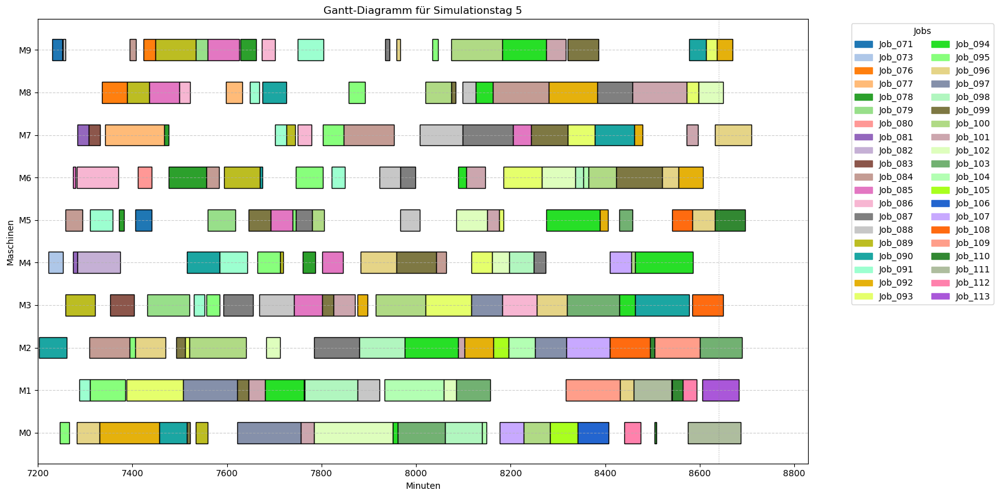


Solver-Status         : OPTIMAL
Objective Value       : 932.00
Best Objective Bound  : 932.00
Laufzeit              : 22.58 Sekunden

  Scheduling-Dauer: 0 Minuten und 22.97 Sekunden.


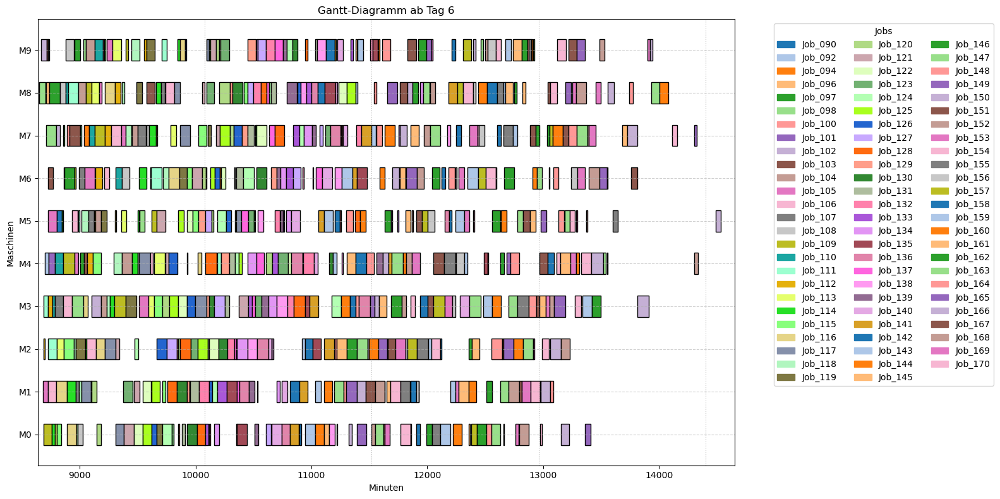

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0         6
0              70
0 - 60          0
60 - 120        0
120 - 180       1
>180            0
Name: count, dtype: int32
[144:10:00] Job_098 started on M8
[144:29:00] Job_102 started on M9
[144:43:00] Job_105 started on M1
[144:47:00] Job_109 started on M0
[144:47:00] Job_111 started on M3
[144:50:00] Job_112 started on M2
[144:59:00] Job_092 started on M4
[145:00:48] Job_112 finished on M2 (after 10 minutes 49 seconds)
[145:19:16] Job_102 finished on M9 (after 50 minutes 16 seconds)
[145:19:16] Job_103 started on M9
[145:25:29] Job_092 finished on M4 (after 26 minutes 29 seconds)
[145:28:28] Job_105 finished on M1 (after 45 minutes 29 seconds)
[145:29:00] Job_106 starte

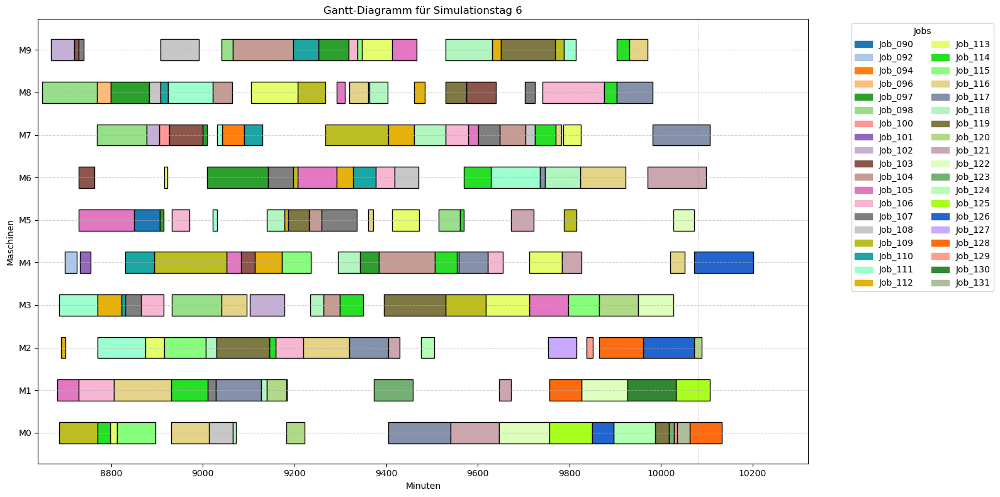


Solver-Status         : OPTIMAL
Objective Value       : 702.00
Best Objective Bound  : 702.00
Laufzeit              : 22.70 Sekunden

  Scheduling-Dauer: 0 Minuten und 23.11 Sekunden.


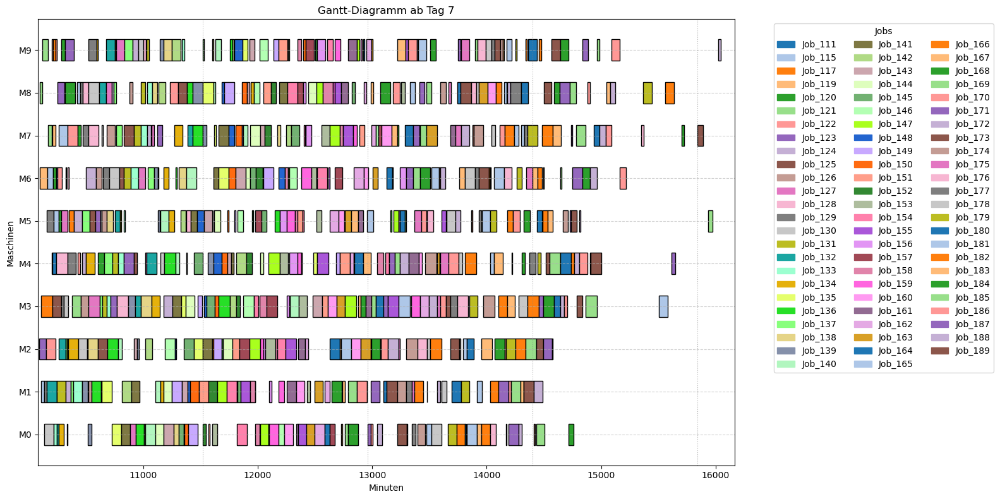

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0         4
0              68
0 - 60          1
60 - 120        1
120 - 180       0
>180            0
Name: count, dtype: int32
[168:09:00] Job_123 started on M2
[168:18:00] Job_119 started on M6
[168:18:00] Job_121 started on M8
[168:27:00] Job_115 started on M1
[168:27:00] Job_117 started on M3
[168:36:07] Job_121 finished on M8 (after 18 minutes 08 seconds)
[168:37:00] Job_121 started on M9
[168:53:00] Job_130 started on M0
[168:55:18] Job_115 finished on M1 (after 28 minutes 19 seconds)
[168:55:18] Job_129 started on M1
[168:57:29] Job_123 finished on M2 (after 48 minutes 29 seconds)
[169:10:00] Job_122 started on M2
[169:22:05] Job_129 finished on M1 (after 26 minutes 47 s

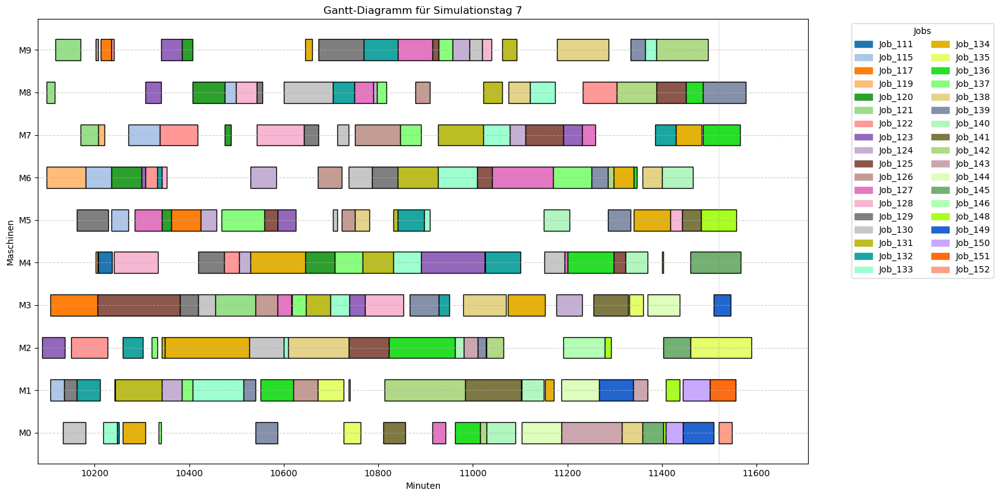


Solver-Status         : OPTIMAL
Objective Value       : 310.00
Best Objective Bound  : 310.00
Laufzeit              : 9.98 Sekunden

  Scheduling-Dauer: 0 Minuten und 10.39 Sekunden.


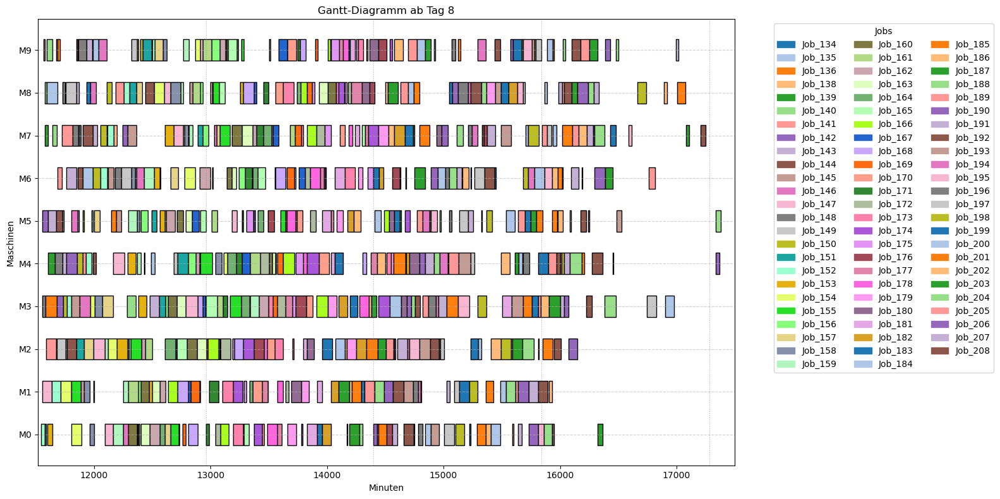

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0         3
0              70
0 - 60          1
60 - 120        0
120 - 180       0
>180            0
Name: count, dtype: int32
[192:28:00] Job_152 started on M0
[192:36:00] Job_147 started on M1
[192:38:00] Job_142 started on M5
[192:38:00] Job_148 started on M3
[192:47:00] Job_145 started on M9
[192:53:40] Job_145 finished on M9 (after 06 minutes 40 seconds)
[192:55:04] Job_152 finished on M0 (after 27 minutes 05 seconds)
[192:57:00] Job_151 started on M0
[192:58:00] Job_139 started on M7
[192:58:00] Job_140 started on M8
[193:09:53] Job_151 finished on M0 (after 12 minutes 54 seconds)
[193:10:00] Job_141 started on M2
[193:12:16] Job_139 finished on M7 (after 14 minutes 16 s

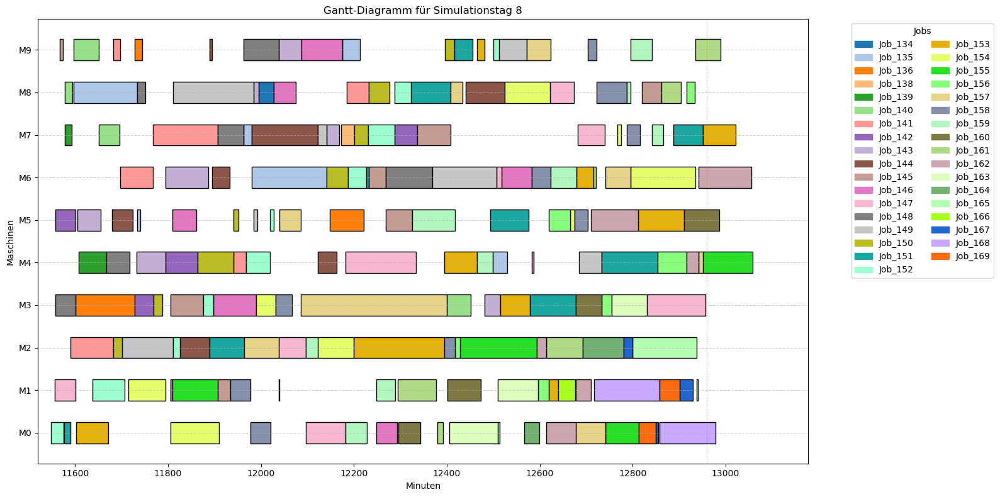


Solver-Status         : OPTIMAL
Objective Value       : 309.00
Best Objective Bound  : 309.00
Laufzeit              : 79.92 Sekunden

  Scheduling-Dauer: 1 Minuten und 20.33 Sekunden.


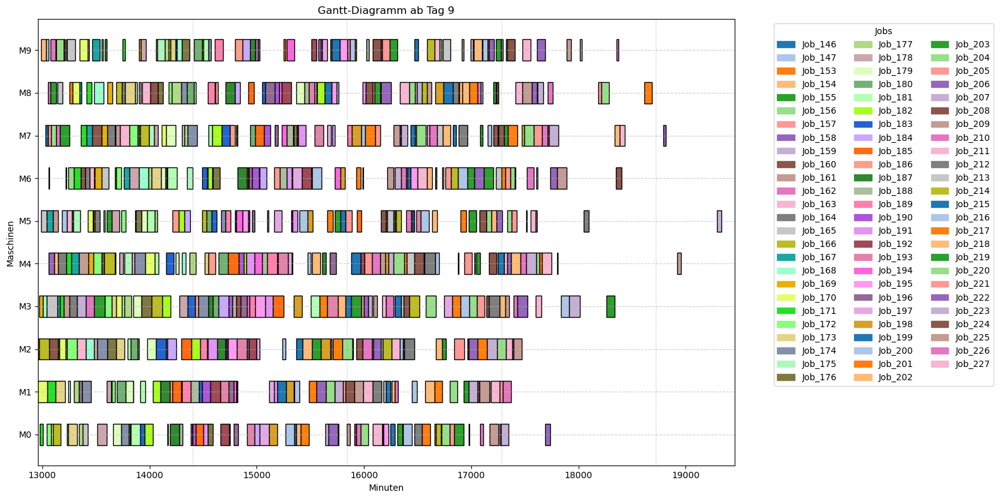

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      1
-60 - 0         8
0              66
0 - 60          2
60 - 120        0
120 - 180       0
>180            0
Name: count, dtype: int32
[216:00:00] Job_169 started on M2
[216:00:00] Job_170 started on M1
[216:07:59] Job_169 finished on M2 (after 07 minutes 59 seconds)
[216:09:00] Job_166 started on M2
[216:09:00] Job_169 started on M3
[216:19:00] Job_171 started on M0
[216:27:00] Job_165 started on M5
[216:30:00] Job_154 started on M9
[216:41:50] Job_171 finished on M0 (after 22 minutes 50 seconds)
[216:54:55] Job_169 finished on M3 (after 45 minutes 56 seconds)
[216:54:55] Job_168 started on M3
[216:57:19] Job_165 finished on M5 (after 30 minutes 19 seconds)
[217:03:25] Job_170 finish

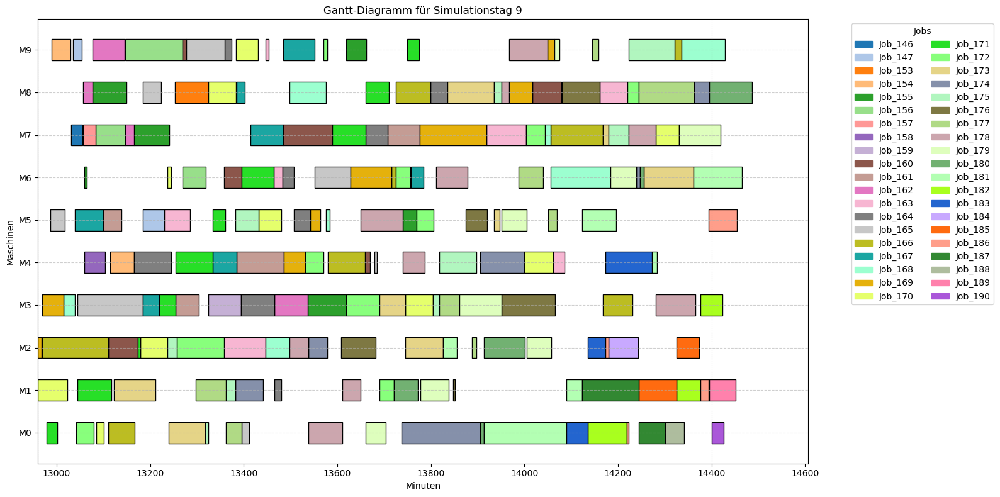


Solver-Status         : OPTIMAL
Objective Value       : 2595.00
Best Objective Bound  : 2595.00
Laufzeit              : 21.18 Sekunden

  Scheduling-Dauer: 0 Minuten und 21.57 Sekunden.


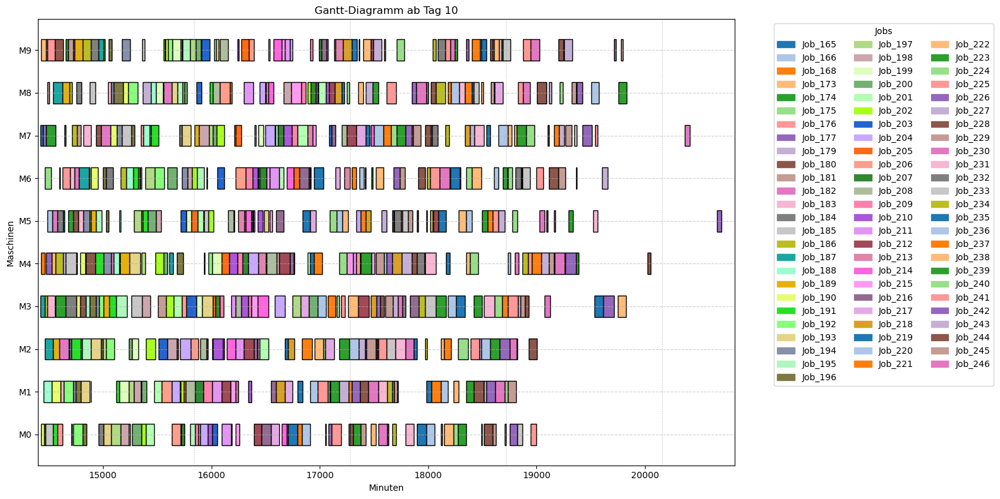

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0         6
0              64
0 - 60          2
60 - 120        3
120 - 180       1
>180            0
Name: count, dtype: int32
[240:20:00] Job_165 started on M7
[240:24:00] Job_187 started on M3
[240:26:00] Job_190 started on M0
[240:30:00] Job_168 started on M4
[240:30:00] Job_173 started on M9
[240:46:28] Job_165 finished on M7 (after 26 minutes 28 seconds)
[240:46:28] Job_177 started on M7
[240:52:00] Job_188 started on M1
[240:55:54] Job_168 finished on M4 (after 25 minutes 55 seconds)
[240:56:36] Job_190 finished on M0 (after 30 minutes 36 seconds)
[240:56:36] Job_189 started on M0
[241:01:59] Job_187 finished on M3 (after 37 minutes 59 seconds)
[241:03:00] Job_186 starte

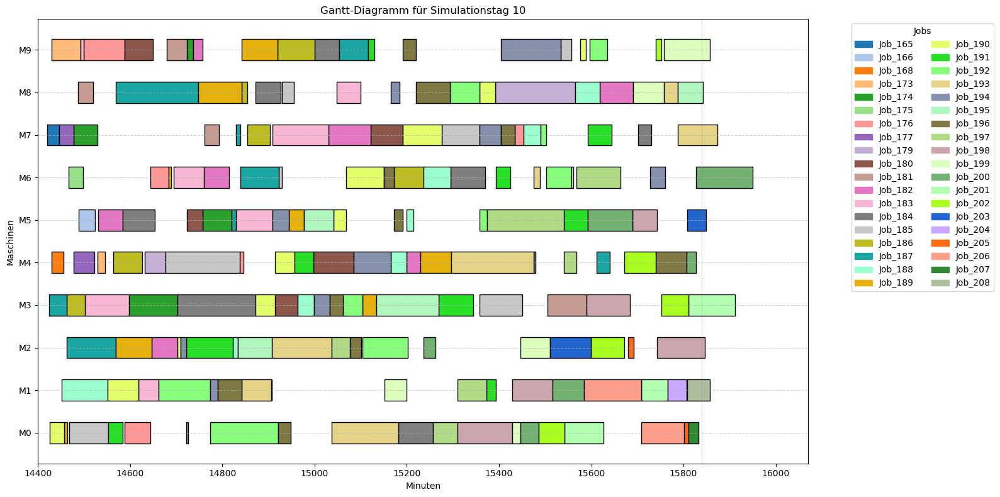


Solver-Status         : OPTIMAL
Objective Value       : 290.00
Best Objective Bound  : 290.00
Laufzeit              : 46.43 Sekunden

  Scheduling-Dauer: 0 Minuten und 46.82 Sekunden.


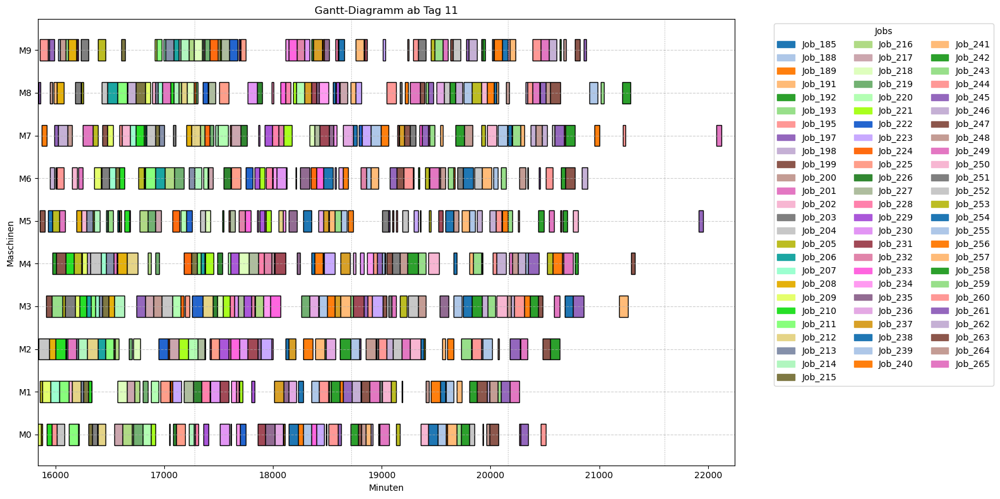

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0         6
0              69
0 - 60          1
60 - 120        0
120 - 180       0
>180            0
Name: count, dtype: int32
[264:00:00] Job_209 started on M0
[264:03:00] Job_197 started on M8
[264:06:00] Job_204 started on M2
[264:17:00] Job_205 started on M1
[264:17:38] Job_209 finished on M0 (after 17 minutes 39 seconds)
[264:18:00] Job_195 started on M9
[264:18:00] Job_199 started on M5
[264:20:07] Job_197 finished on M8 (after 17 minutes 08 seconds)
[264:29:00] Job_208 started on M0
[264:31:37] Job_205 finished on M1 (after 14 minutes 38 seconds)
[264:34:00] Job_189 started on M7
[264:39:00] Job_209 started on M1
[264:39:15] Job_208 finished on M0 (after 10 minutes 15 s

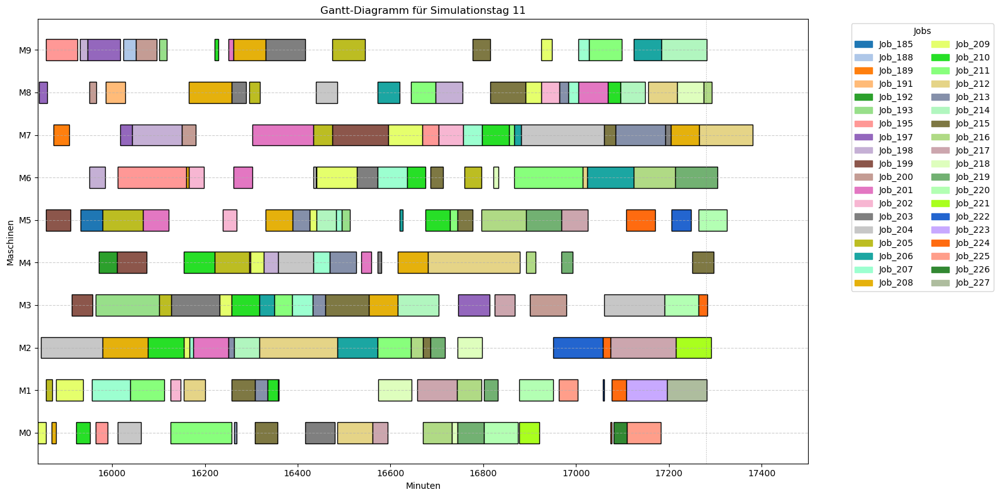


Solver-Status         : OPTIMAL
Objective Value       : 930.00
Best Objective Bound  : 930.00
Laufzeit              : 19.39 Sekunden

  Scheduling-Dauer: 0 Minuten und 20.00 Sekunden.


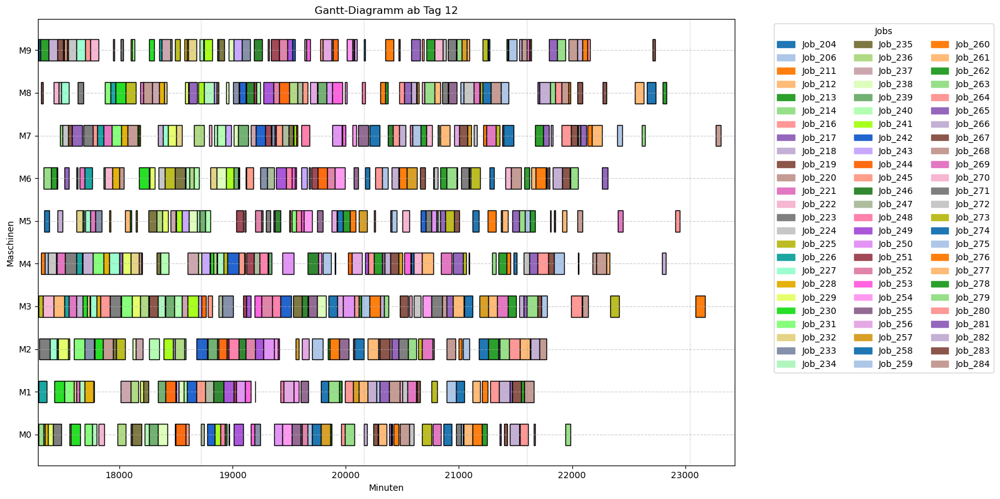

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0         5
0              69
0 - 60          0
60 - 120        0
120 - 180       1
>180            0
Name: count, dtype: int32
[288:02:00] Job_204 started on M9
[288:02:00] Job_214 started on M0
[288:02:00] Job_226 started on M1
[288:04:00] Job_225 started on M3
[288:12:00] Job_223 started on M2
[288:17:49] Job_204 finished on M9 (after 15 minutes 50 seconds)
[288:24:00] Job_213 started on M9
[288:25:00] Job_211 started on M4
[288:25:00] Job_219 started on M8
[288:49:22] Job_219 finished on M8 (after 24 minutes 23 seconds)
[288:53:31] Job_225 finished on M3 (after 49 minutes 32 seconds)
[288:53:31] Job_222 started on M3
[288:54:00] Job_204 started on M5
[289:11:28] Job_226 fin

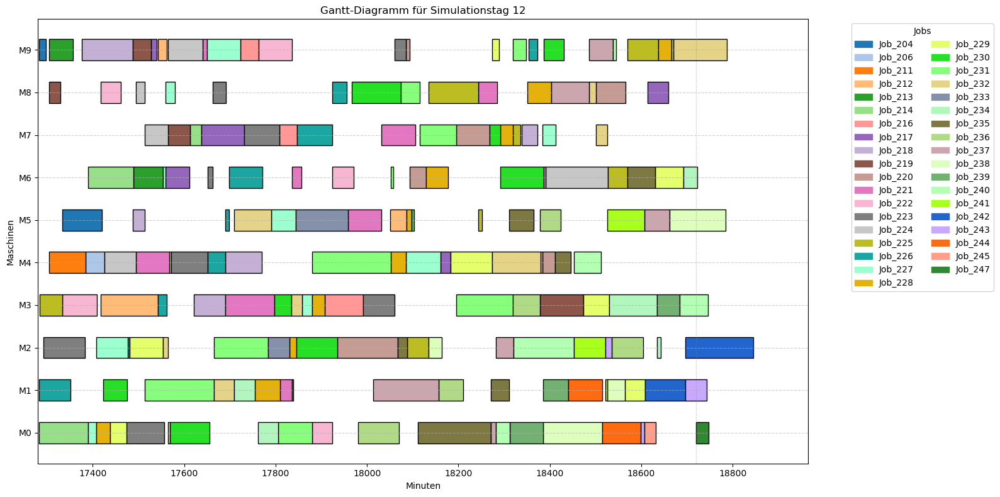

In [30]:
prefix_name = f"{notebook_prefix}_simple"

first_start = 1
last_planning_start = 12

df_plan = df_plan_init
df_execution = df_execution_init
df_undone = df_undone_init

for day_numb in range(first_start, last_planning_start + 1):
    day_start = day_length * day_numb
    day_end = day_start + day_length
    planning_end = day_start + horizon_days * day_length

    # ------------------- I. Ankunfts- und Operationsvorbereitung -------------------
    df_jssp_curr, df_times_curr = rp_proced.filter_jobs_by_arrival_window(df_times, df_jssp, day_start, planning_end)
    df_jssp_curr = rp_proced.extend_with_undone_operations(df_jssp_curr, df_undone)
    df_times_curr = rp_proced.update_times_after_operation_changes(df_times, df_jssp_curr)

    # ------------------- II. Relevante laufende Operationen -------------------------
    df_execution_important = rp_proced.get_operations_running_into_day(df_execution, day_start)

    # ------------------- III. Rescheduling durchführen -------------------------------

    starting_time = time.time()
    df_plan = rssv.solve_cp_jssp_lateness_by_tardiness_and_earliness_with_fixed_ops(df_jssp_curr, df_times_curr, df_execution_important,
                                                                                    w_t = 5, reschedule_start = day_start, 
                                                                                    msg=False, timeLimit=max_time, gapRel= 0)

    
    solver_duration = time.time() - starting_time
    print(f"\n  Scheduling-Dauer: {int(solver_duration // 60)} Minuten und {(solver_duration % 60):.2f} Sekunden.")

    df_plan.to_csv(get_schedule_filename(prefix_name, day=day_numb), index=False)

    show.plot_gantt_machines(df_plan, title=f"Gantt-Diagramm ab Tag {day_numb}")
    check.check_constraints(df_plan)

    last_ops = df_plan.sort_values(['Job', 'Operation']).drop_duplicates('Job', keep='last')
    print(show.count_column_grouped(last_ops, "Lateness", max_val = 180, steps= 60))

    # ------------------- IV. Einen Tag simulieren -------------------------------------

    simulation = ProductionDaySimulation(df_plan, vc=0.35)
    df_execution, df_undone = simulation.run(start_time=day_start, end_time=day_end)
    if not df_execution.empty:
        show.plot_gantt_machines(df_execution, title=f"Gantt-Diagramm für Simulationstag {day_numb}", duration_column="Simulated Processing Time")
    else:
        print(f"Nothing executed on day {day_numb}")

## B) Rolling Planning mit "Deviation Penalty"

**Zielfunktion:**

Minimiere die gewichtete Summe aus Tardiness, Earliness und Abweichung vom ursprünglichen Startzeitpunkt (Deviation):

\\[
Z(\sigma) = r \cdot \sum_{j} \left( w_t \cdot \text{Tardiness}_j + w_e \cdot \text{Earliness}_j \right) + (1 - r) \cdot \sum_{j,o} \left| S_{jo} - S_{jo}^{\text{original}} \right|
\\]

wobei:

- \\( r \in [0,\ 1] \\): Gewichtung zwischen Termintreue und Planstabilität  
- \\( w_t \in \mathbb{N},\ w_e \in \mathbb{N} \\): Gewicht für Tardiness und Earliness  
- \\( \text{Tardiness}_j = \max(0, C_j - d_j) \\), \\( \text{Earliness}_j = \max(0, d_j - C_j) \\)  
    - \\( C_j \\) ist das Fertigstellungsdatum des letzten Schritts von Job \\( j \\)  
    - \\( d_j \\) ist die Deadline für Job \\( j \\)  
- \\( S_{jo} \\) ist der Startzeitpunkt der \\( o \\)-ten Operation von Job \\( j \\)  
- \\( S_{jo}^{\text{original}} \\) ist der ursprünglich geplante Startzeitpunkt

In [33]:
def solve_cp_jssp_lateness_by_tardiness_and_earliness_with_devpen(
    df_jssp: pd.DataFrame,
    df_arrivals_deadlines: pd.DataFrame,
    df_executed: pd.DataFrame,
    df_original_plan: pd.DataFrame,
    w_t: int = 5,
    w_e: int = 1,
    r: float = 0.5,
    reschedule_start: float = 1440.0,
    sort_ascending: bool = False,
    msg: bool = False,
    timeLimit: int = 3600,
    gapRel: float = 0.0
) -> pd.DataFrame:
    """
    Solves a Job-Shop Scheduling Problem using Constraint Programming with:
    - weighted tardiness,
    - earliness,
    - deviation penalty from a given reference plan (df_original_plan).

    Only deviations for operations present in both df_jssp and df_original_plan are considered.

    Parameters:
        df_jssp: Job-Shop structure with ['Job','Operation','Machine','Processing Time']
        df_arrivals_deadlines: Arrival and Deadline info per Job
        df_executed: Already executed operations
        df_original_plan: Reference plan with original start times
        w_t, w_e: Weights for tardiness and earliness
        r: Relative weight between lateness and deviation (0–1)
        reschedule_start: Planning starts from this time onward
        sort_ascending: Sort jobs by deadline ascending (default: False)
        msg: Verbose solver output
        timeLimit: Max solver time in seconds
        gapRel: Relative gap limit

    Returns:
        df_schedule: A DataFrame with scheduled operations and timing info
    """

    model = cp_model.CpModel()
    w_t = int(w_t)
    w_e = int(w_e)
    r_scaled = int(round(r * 100))  # scaled for integer arithmetic

    # === Vorbereitung: Ankunft, Deadline, Jobliste ===
    df_arrivals_deadlines = df_arrivals_deadlines.sort_values("Deadline", ascending=sort_ascending).reset_index(drop=True)
    arrival = df_arrivals_deadlines.set_index("Job")["Arrival"].to_dict()
    deadline = df_arrivals_deadlines.set_index("Job")["Deadline"].to_dict()
    jobs = df_arrivals_deadlines["Job"].tolist()

    # === Relevante Deviation-Paare bestimmen ===
    deviation_relevant_ops = set(
        df_jssp[["Job", "Operation"]].apply(tuple, axis=1)
    ) & set(
        df_original_plan[["Job", "Operation"]].apply(tuple, axis=1)
    )

    original_start = {
        (row["Job"], row["Operation"]): int(round(row["Start"]))
        for _, row in df_original_plan.iterrows()
        if (row["Job"], row["Operation"]) in deviation_relevant_ops
    }

    # === Operationen strukturieren ===
    ops_grouped = df_jssp.sort_values(["Job", "Operation"]).groupby("Job")
    all_ops, machines = [], set()
    for job in jobs:
        seq = []
        for _, row in ops_grouped.get_group(job).iterrows():
            op_id = int(row["Operation"])
            m = str(row["Machine"])
            d = int(round(row["Processing Time"]))
            seq.append((op_id, m, d))
            machines.add(m)
        all_ops.append(seq)

    # === Planungshorizont abschätzen ===
    horizon = int(df_jssp["Processing Time"].sum() + max(deadline.values()))

    # === Fixierte Operationen berücksichtigen ===
    df_executed_fixed = df_executed[df_executed["End"] >= reschedule_start]
    fixed_ops = {
        m: list(grp[["Start", "End"]].itertuples(index=False, name=None))
        for m, grp in df_executed_fixed.groupby("Machine")
    }
    last_executed_end = df_executed.groupby("Job")["End"].max().to_dict()

    # === Variablen definieren ===
    starts, ends, intervals = {}, {}, {}
    weighted_terms = []
    deviation_terms = []

    for j, job in enumerate(jobs):
        for o, (op_id, m, d) in enumerate(all_ops[j]):
            suffix = f"{j}_{o}"
            start = model.NewIntVar(0, horizon, f"start_{suffix}")
            end = model.NewIntVar(0, horizon, f"end_{suffix}")
            interval = model.NewIntervalVar(start, d, end, f"interval_{suffix}")
            starts[(j, o)] = start
            ends[(j, o)] = end
            intervals[(j, o)] = (interval, m)

    # === Constraints und Zielterme ===
    for j, job in enumerate(jobs):
        last_op_index = len(all_ops[j]) - 1
        job_end = ends[(j, last_op_index)]

        # Lateness = End - Deadline
        lateness = model.NewIntVar(-horizon, horizon, f"lateness_{j}")
        model.Add(lateness == job_end - deadline[job])

        # Tardiness
        tardiness = model.NewIntVar(0, horizon, f"tardiness_{j}")
        model.AddMaxEquality(tardiness, [lateness, 0])
        term_tardiness = model.NewIntVar(0, horizon * w_t, f"term_tardiness_{j}")
        model.Add(term_tardiness == w_t * tardiness)
        weighted_terms.append(term_tardiness)

        # Earliness
        earliness = model.NewIntVar(0, horizon, f"earliness_{j}")
        model.AddMaxEquality(earliness, [-lateness, 0])
        term_earliness = model.NewIntVar(0, horizon * w_e, f"term_earliness_{j}")
        model.Add(term_earliness == w_e * earliness)
        weighted_terms.append(term_earliness)

        # Startzeitbedingungen
        model.Add(starts[(j, 0)] >= max(arrival[job], int(reschedule_start)))
        if job in last_executed_end:
            model.Add(starts[(j, 0)] >= int(math.ceil(last_executed_end[job])))

        # Technologische Reihenfolge
        for o in range(1, len(all_ops[j])):
            model.Add(starts[(j, o)] >= ends[(j, o - 1)])

        # Deviation: nur für relevante Ops
        for o, (op_id, _, _) in enumerate(all_ops[j]):
            key = (job, op_id)
            if key in original_start:
                dev = model.NewIntVar(0, horizon, f"dev_{j}_{o}")
                diff = model.NewIntVar(-horizon, horizon, f"diff_{j}_{o}")
                model.Add(diff == starts[(j, o)] - original_start[key])
                model.AddAbsEquality(dev, diff)
                deviation_terms.append(dev)

    # === Maschinenrestriktionen (inkl. fixierter Intervalle) ===
    for m in machines:
        machine_intervals = [interval for (j, o), (interval, mach) in intervals.items() if mach == m]
        for fixed_start, fixed_end in fixed_ops.get(m, []):
            start = math.floor(fixed_start)
            end = math.ceil(fixed_end)
            duration = end - start
            if duration > 0:
                fixed_interval = model.NewIntervalVar(start, duration, end, f"fixed_{m}_{end}")
                machine_intervals.append(fixed_interval)
        model.AddNoOverlap(machine_intervals)

    # === Zielfunktion kombinieren ===
    weighted_part = model.NewIntVar(0, horizon * len(weighted_terms), "weighted_part")
    deviation_part = model.NewIntVar(0, horizon * len(deviation_terms), "deviation_part")
    model.Add(weighted_part == sum(weighted_terms))
    model.Add(deviation_part == sum(deviation_terms))

    total_cost = model.NewIntVar(0, horizon * len(jobs) * 100, "total_cost")
    model.Add(total_cost == r_scaled * weighted_part + (100 - r_scaled) * deviation_part)
    model.Minimize(total_cost)

    # === Solver-Einstellungen ===
    solver = cp_model.CpSolver()
    solver.parameters.log_search_progress = msg
    solver.parameters.max_time_in_seconds = timeLimit
    solver.parameters.relative_gap_limit = gapRel
    status = solver.Solve(model)

    # === Ergebnis extrahieren ===
    records = []
    if status in [cp_model.OPTIMAL, cp_model.FEASIBLE]:
        for j, job in enumerate(jobs):
            for o, (op_id, m, d) in enumerate(all_ops[j]):
                st = solver.Value(starts[(j, o)])
                ed = st + d
                lateness_val = ed - deadline[job]
                records.append({
                    "Job": job,
                    "Operation": op_id,
                    "Arrival": arrival[job],
                    "Deadline": deadline[job],
                    "Machine": m,
                    "Start": st,
                    "Processing Time": d,
                    "End": ed,
                    "Lateness": lateness_val,
                    "Tardiness": max(0, lateness_val),
                    "Earliness": max(0, -lateness_val)
                })

        df_schedule = pd.DataFrame.from_records(records).sort_values(["Start", "Job", "Operation"]).reset_index(drop=True)
    else:
        print(f"\nSolver-Status         : {solver.StatusName(status)}")
        print("No feasible solution found!")
        df_schedule = pd.DataFrame()

    # === Logging ===
    print(f"\nSolver-Status         : {solver.StatusName(status)}")
    print(f"Objective Value       : {solver.ObjectiveValue():.2f}")
    print(f"Best Objective Bound  : {solver.BestObjectiveBound():.2f}")
    print(f"Laufzeit              : {solver.WallTime():.2f} Sekunden")
    print(f"Deviation terms       : {len(deviation_terms)}")

    return df_schedule



Solver-Status         : FEASIBLE
Objective Value       : 423140.00
Best Objective Bound  : 256420.00
Laufzeit              : 1801.02 Sekunden
Deviation terms       : 458

  Scheduling-Dauer: 30 Minuten und 1.59 Sekunden.


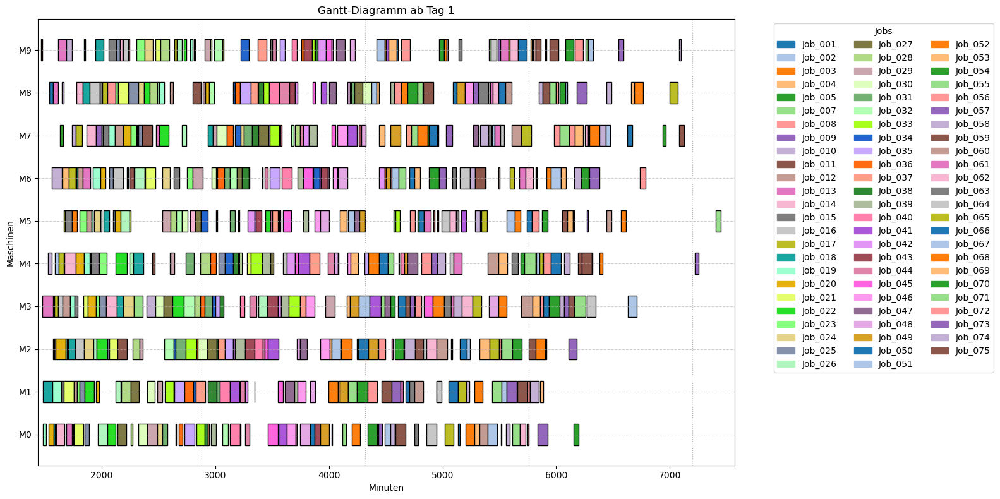

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      1
-60 - 0         9
0              63
0 - 60          1
60 - 120        0
120 - 180       0
>180            0
Name: count, dtype: int32
[24:29:00] Job_012 started on M9
[24:36:00] Job_013 started on M3
[24:40:57] Job_012 finished on M9 (after 11 minutes 58 seconds)
[24:41:00] Job_018 started on M1
[24:43:00] Job_019 started on M0
[25:06:28] Job_019 finished on M0 (after 23 minutes 28 seconds)
[25:30:00] Job_010 started on M4
[25:33:00] Job_020 started on M0
[25:41:00] Job_001 started on M8
[25:56:34] Job_010 finished on M4 (after 26 minutes 34 seconds)
[25:59:16] Job_018 finished on M1 (after 78 minutes 16 seconds)
[26:02:00] Job_010 started on M6
[26:03:00] Job_001 finished on M8 (aft

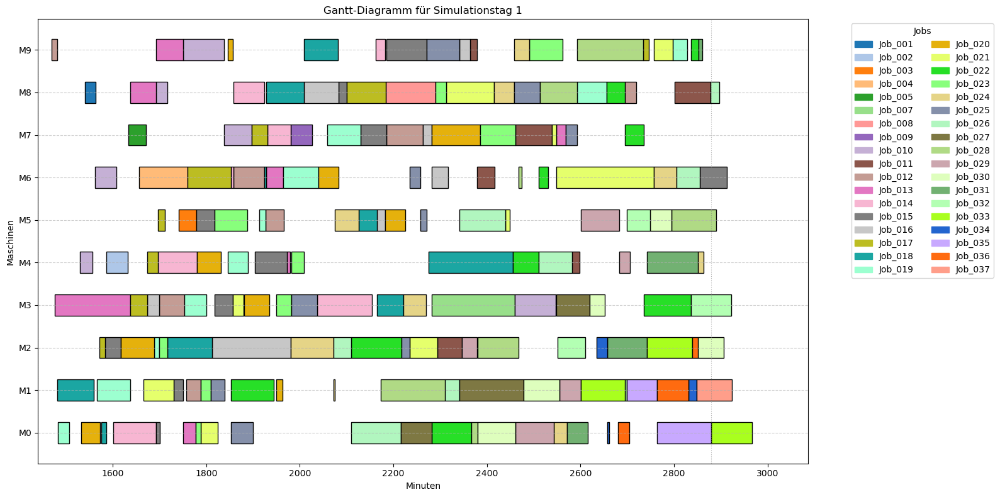


Solver-Status         : FEASIBLE
Objective Value       : 322260.00
Best Objective Bound  : 219670.00
Laufzeit              : 1800.78 Sekunden
Deviation terms       : 462

  Scheduling-Dauer: 30 Minuten und 1.26 Sekunden.


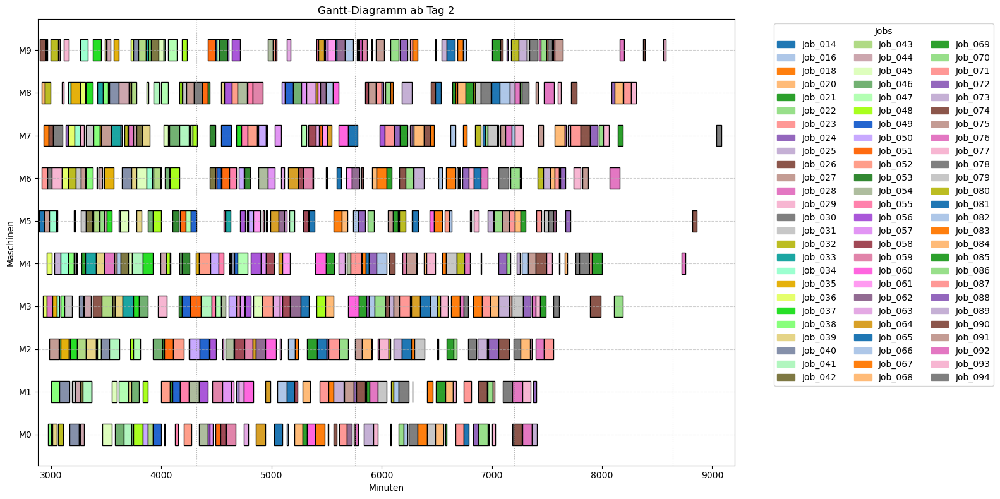

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      1
-60 - 0        10
0              65
0 - 60          0
60 - 120        1
120 - 180       1
>180            0
Name: count, dtype: int32
[48:11:00] Job_014 started on M5
[48:18:00] Job_026 started on M9
[48:33:00] Job_020 started on M8
[48:34:00] Job_023 started on M6
[48:40:11] Job_014 finished on M5 (after 29 minutes 12 seconds)
[48:43:00] Job_036 started on M3
[48:53:00] Job_018 started on M7
[48:54:00] Job_027 started on M5
[49:01:02] Job_026 finished on M9 (after 43 minutes 02 seconds)
[49:05:28] Job_023 finished on M6 (after 31 minutes 29 seconds)
[49:13:58] Job_020 finished on M8 (after 40 minutes 58 seconds)
[49:13:58] Job_032 started on M8
[49:16:00] Job_030 started on M9
[49:1

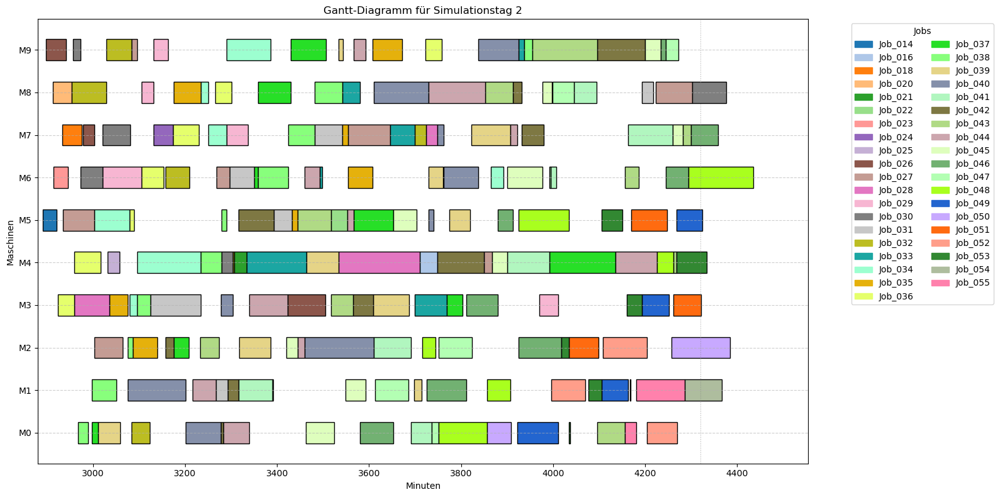


Solver-Status         : FEASIBLE
Objective Value       : 100540.00
Best Objective Bound  : 70790.00
Laufzeit              : 1800.91 Sekunden
Deviation terms       : 458

  Scheduling-Dauer: 30 Minuten und 1.51 Sekunden.


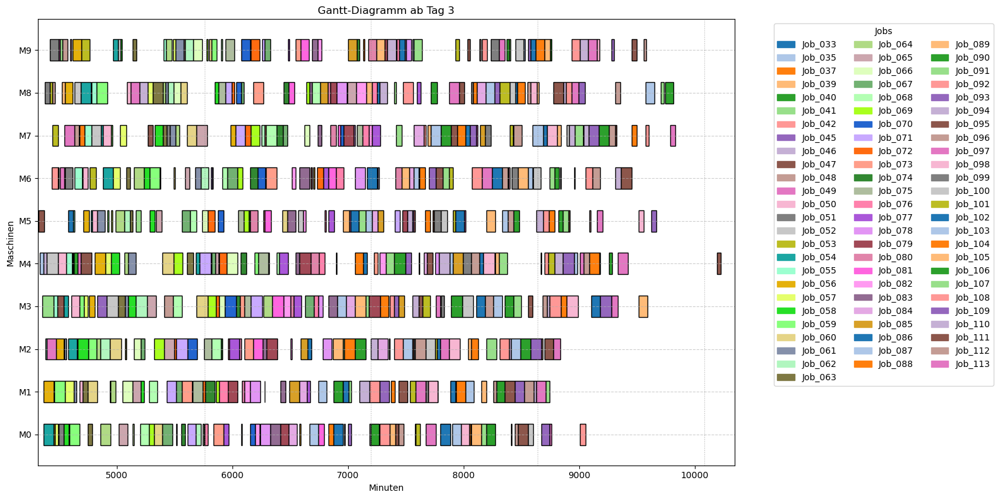

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0         9
0              65
0 - 60          2
60 - 120        0
120 - 180       0
>180            0
Name: count, dtype: int32
[72:05:00] Job_047 started on M5
[72:14:00] Job_035 started on M4
[72:37:00] Job_041 started on M3
[72:48:00] Job_054 started on M0
[72:48:00] Job_056 started on M1
[72:57:00] Job_051 started on M8
[72:59:55] Job_035 finished on M4 (after 45 minutes 56 seconds)
[72:59:55] Job_046 started on M4
[73:01:59] Job_047 finished on M5 (after 56 minutes 59 seconds)
[73:06:00] Job_055 started on M2
[73:14:04] Job_055 finished on M2 (after 08 minutes 04 seconds)
[73:15:00] Job_049 started on M2
[73:16:36] Job_046 finished on M4 (after 16 minutes 40 seconds)
[73:1

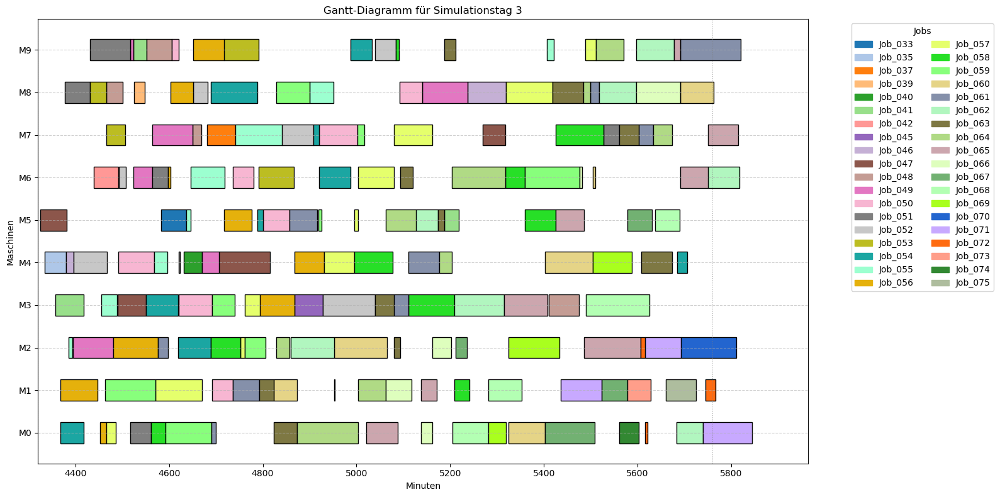


Solver-Status         : FEASIBLE
Objective Value       : 298910.00
Best Objective Bound  : 174440.00
Laufzeit              : 1801.18 Sekunden
Deviation terms       : 469

  Scheduling-Dauer: 30 Minuten und 1.62 Sekunden.


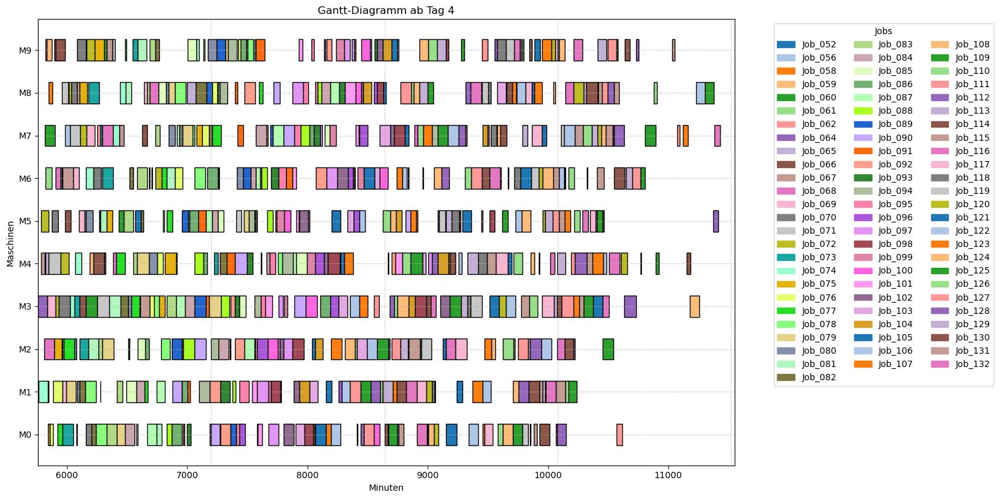

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           1
-180 - -120     0
-120 - -60      0
-60 - 0         8
0              66
0 - 60          0
60 - 120        0
120 - 180       1
>180            0
Name: count, dtype: int32
[96:00:00] Job_064 started on M3
[96:07:00] Job_074 started on M1
[96:25:00] Job_067 started on M4
[96:27:00] Job_072 started on M5
[96:51:00] Job_068 started on M2
[96:55:00] Job_060 started on M7
[97:00:00] Job_061 started on M6
[97:00:00] Job_069 started on M9
[97:02:27] Job_074 finished on M1 (after 55 minutes 28 seconds)
[97:07:59] Job_067 finished on M4 (after 42 minutes 59 seconds)
[97:07:59] Job_062 started on M4
[97:08:40] Job_069 finished on M9 (after 08 minutes 40 seconds)
[97:11:00] Job_059 started on M9
[97:14:05] Job_062 finished on M4 (a

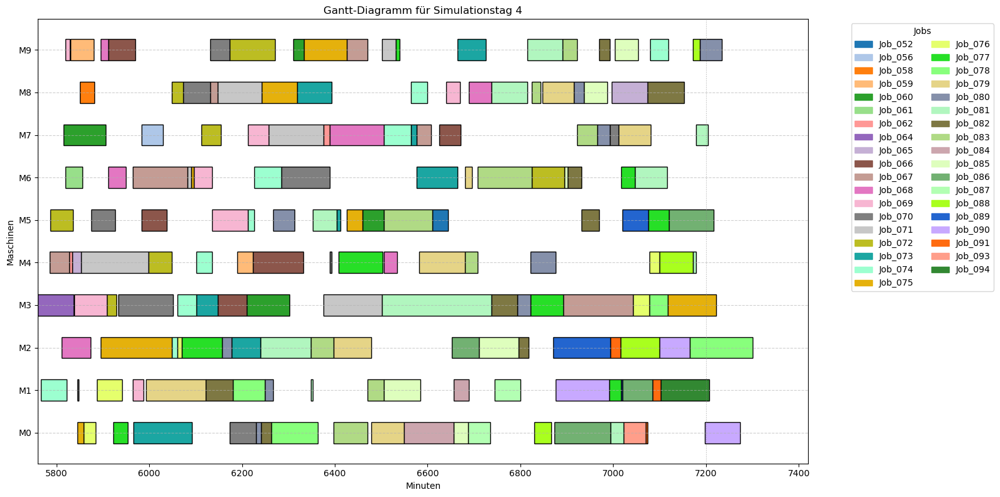


Solver-Status         : FEASIBLE
Objective Value       : 1261860.00
Best Objective Bound  : 822850.00
Laufzeit              : 1801.25 Sekunden
Deviation terms       : 485

  Scheduling-Dauer: 30 Minuten und 1.88 Sekunden.


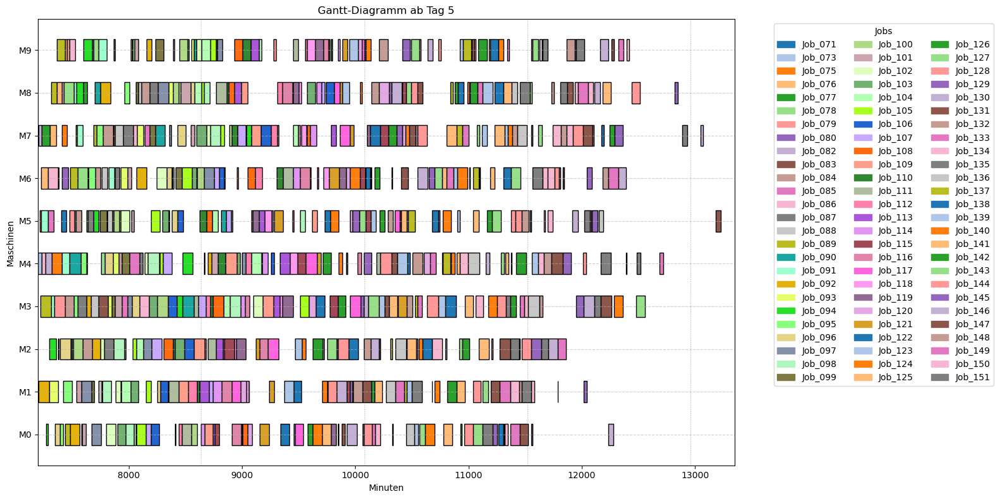

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0        10
0              63
0 - 60          3
60 - 120        0
120 - 180       0
>180            2
Name: count, dtype: int32
[120:00:00] Job_073 started on M4
[120:05:00] Job_082 started on M7
[120:07:00] Job_092 started on M1
[120:17:00] Job_076 started on M5
[120:22:00] Job_089 started on M3
[120:28:30] Job_076 finished on M5 (after 11 minutes 30 seconds)
[120:28:30] Job_091 started on M5
[120:28:30] Job_076 started on M6
[120:41:46] Job_073 finished on M4 (after 41 minutes 47 seconds)
[120:41:46] Job_086 started on M4
[120:51:38] Job_082 finished on M7 (after 46 minutes 39 seconds)
[120:51:38] Job_077 started on M7
[121:02:43] Job_091 finished on M5 (after 34 minutes 14 s

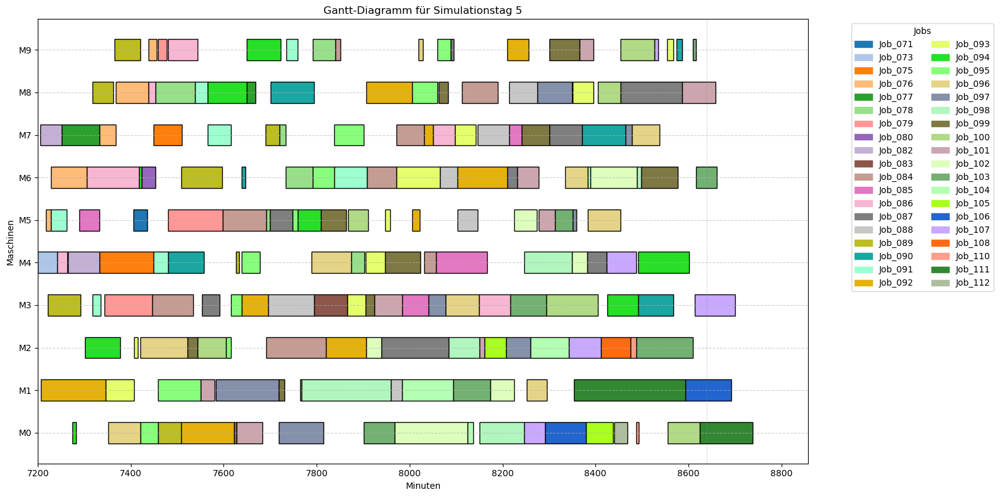


Solver-Status         : FEASIBLE
Objective Value       : 953610.00
Best Objective Bound  : 530970.00
Laufzeit              : 1801.12 Sekunden
Deviation terms       : 485

  Scheduling-Dauer: 30 Minuten und 1.56 Sekunden.


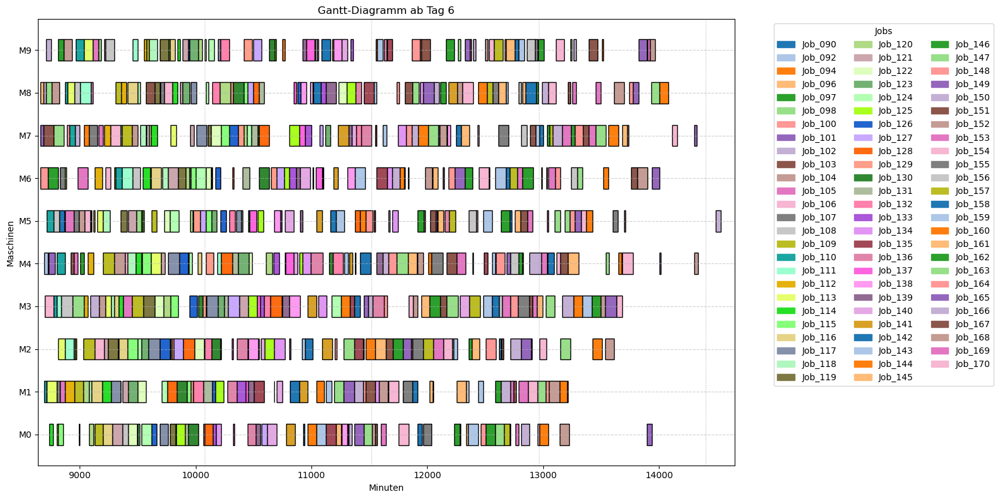

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     1
-120 - -60      0
-60 - 0        11
0              62
0 - 60          2
60 - 120        1
120 - 180       0
>180            0
Name: count, dtype: int32
[144:19:00] Job_096 started on M8
[144:19:00] Job_101 started on M7
[144:21:00] Job_100 started on M6
[144:44:19] Job_101 finished on M7 (after 25 minutes 19 seconds)
[144:49:00] Job_103 started on M7
[144:49:21] Job_100 finished on M6 (after 28 minutes 21 seconds)
[144:52:00] Job_110 started on M1
[144:53:00] Job_092 started on M4
[145:01:00] Job_106 started on M3
[145:14:45] Job_110 finished on M1 (after 22 minutes 46 seconds)
[145:14:45] Job_108 started on M1
[145:14:45] Job_110 started on M5
[145:18:44] Job_108 finished on M1 (after 03 minutes 59 s

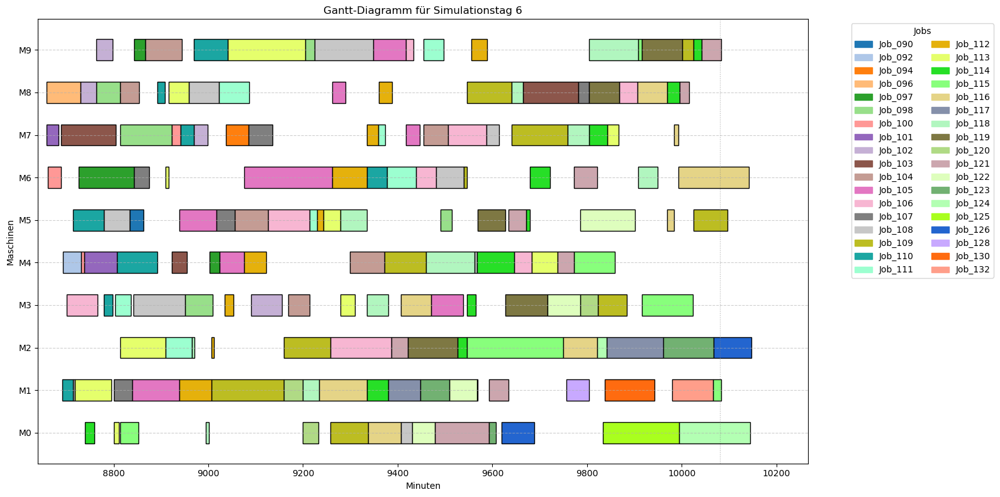


Solver-Status         : FEASIBLE
Objective Value       : 1659700.00
Best Objective Bound  : 1081920.00
Laufzeit              : 1800.85 Sekunden
Deviation terms       : 503

  Scheduling-Dauer: 30 Minuten und 1.41 Sekunden.


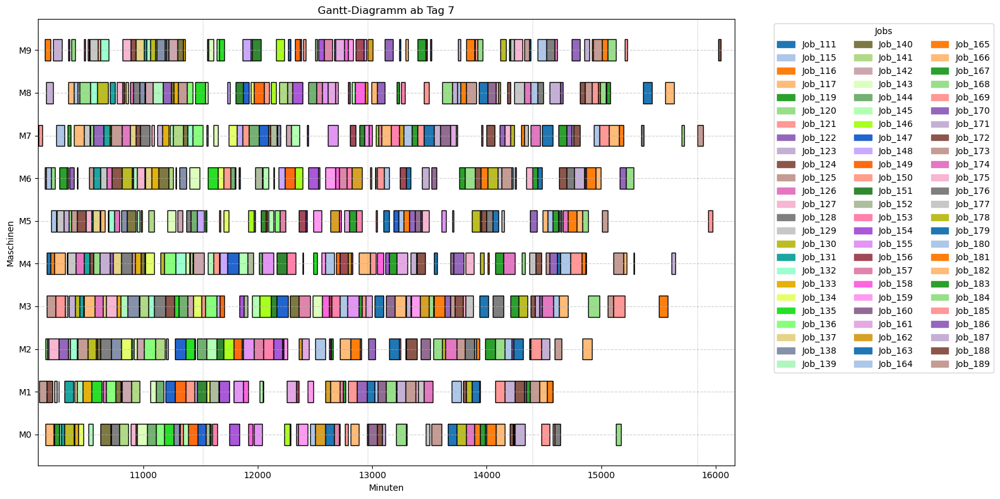

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     1
-120 - -60      1
-60 - 0        11
0              54
0 - 60          5
60 - 120        0
120 - 180       1
>180            2
Name: count, dtype: int32
[168:04:00] Job_121 started on M7
[168:10:00] Job_125 started on M1
[168:40:05] Job_121 finished on M7 (after 36 minutes 05 seconds)
[169:02:00] Job_116 started on M9
[169:02:00] Job_123 started on M6
[169:05:00] Job_117 started on M0
[169:08:00] Job_120 started on M2
[169:13:12] Job_123 finished on M6 (after 11 minutes 13 seconds)
[169:13:12] Job_115 started on M6
[169:13:12] Job_123 started on M8
[169:14:00] Job_111 started on M4
[169:22:10] Job_120 finished on M2 (after 14 minutes 11 seconds)
[169:22:10] Job_129 started on M2
[169:32:29] Job_129 fin

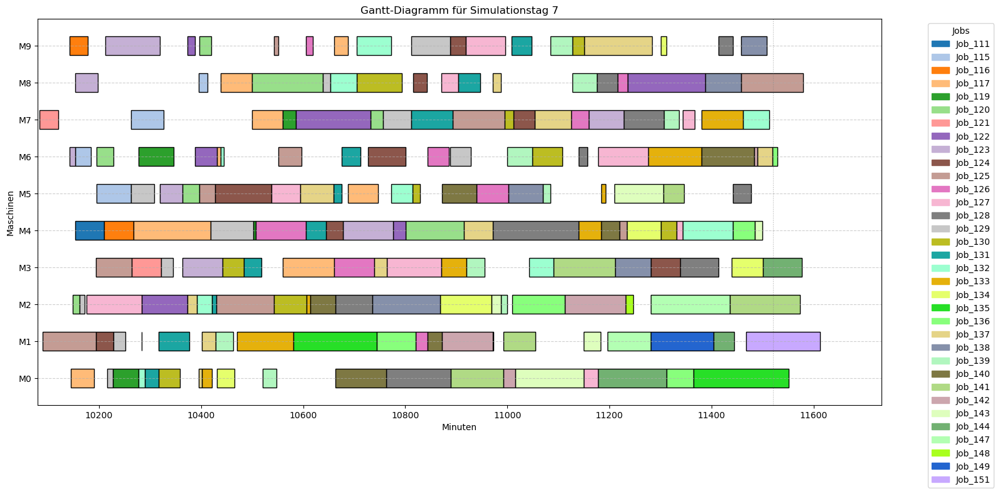


Solver-Status         : FEASIBLE
Objective Value       : 1154680.00
Best Objective Bound  : 743150.00
Laufzeit              : 1801.12 Sekunden
Deviation terms       : 497

  Scheduling-Dauer: 30 Minuten und 1.68 Sekunden.


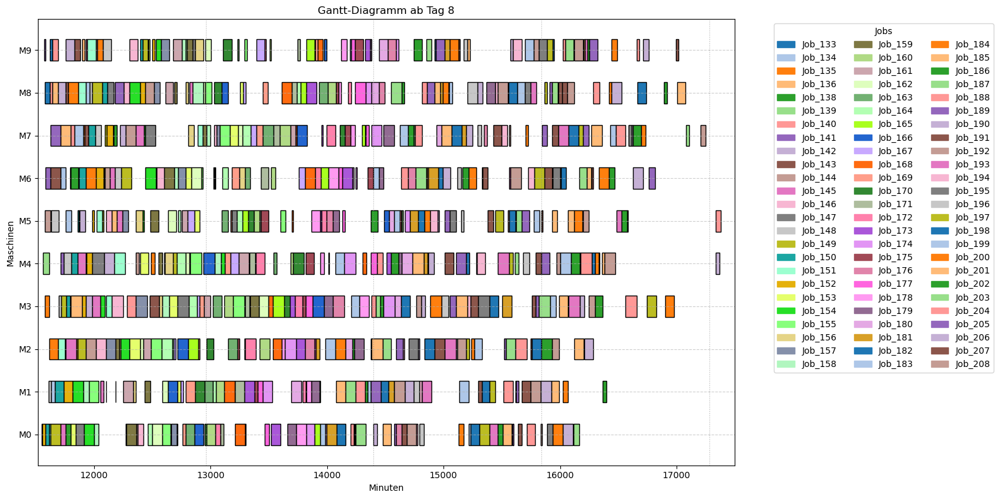

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0        10
0              61
0 - 60          3
60 - 120        0
120 - 180       0
>180            1
Name: count, dtype: int32
[192:31:00] Job_148 started on M0
[192:33:28] Job_148 finished on M0 (after 02 minutes 28 seconds)
[192:37:00] Job_152 started on M0
[192:41:00] Job_139 started on M4
[192:54:00] Job_141 started on M9
[192:57:00] Job_135 started on M3
[192:57:00] Job_144 started on M5
[193:00:00] Job_133 started on M8
[193:07:45] Job_141 finished on M9 (after 13 minutes 45 seconds)
[193:07:45] Job_141 started on M6
[193:17:42] Job_135 finished on M3 (after 20 minutes 43 seconds)
[193:19:17] Job_139 finished on M4 (after 38 minutes 17 seconds)
[193:33:00] Job_148 starte

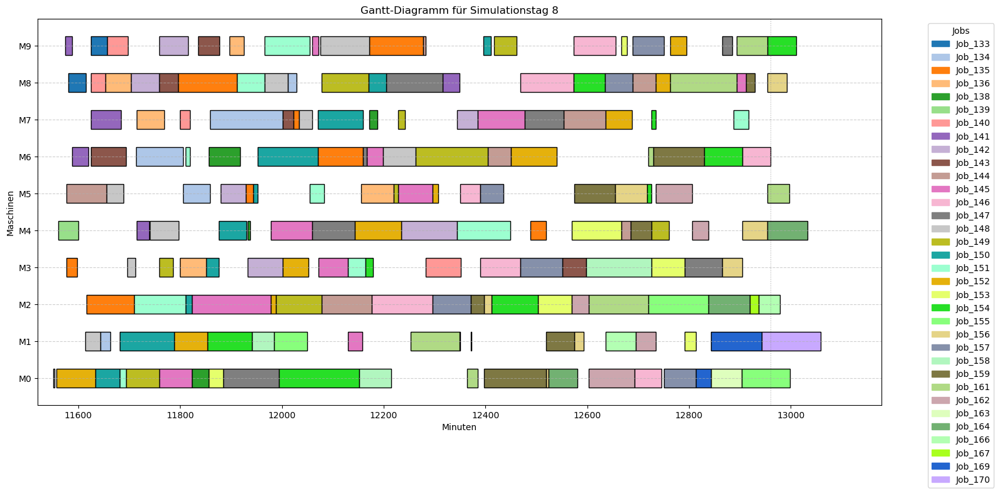


Solver-Status         : FEASIBLE
Objective Value       : 879060.00
Best Objective Bound  : 543820.00
Laufzeit              : 1800.81 Sekunden
Deviation terms       : 499

  Scheduling-Dauer: 30 Minuten und 1.28 Sekunden.


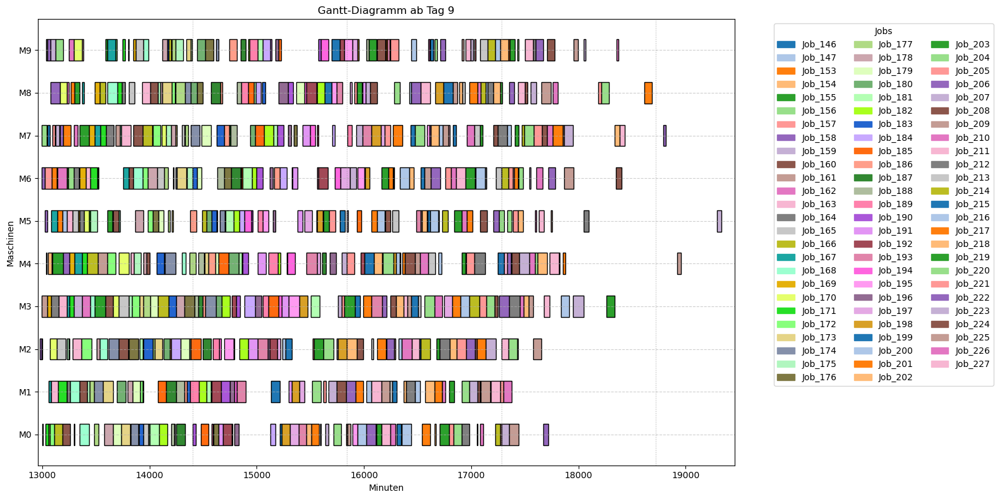

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      1
-60 - 0        12
0              58
0 - 60          5
60 - 120        0
120 - 180       1
>180            0
Name: count, dtype: int32
[216:19:00] Job_158 started on M2
[216:33:00] Job_156 started on M7
[216:33:31] Job_158 finished on M2 (after 14 minutes 31 seconds)
[216:33:31] Job_169 started on M2
[216:33:31] Job_158 started on M6
[216:37:00] Job_161 started on M3
[216:39:00] Job_167 started on M0
[216:42:10] Job_169 finished on M2 (after 08 minutes 39 seconds)
[216:43:20] Job_167 finished on M0 (after 04 minutes 20 seconds)
[216:53:12] Job_158 finished on M6 (after 19 minutes 41 seconds)
[217:04:00] Job_157 started on M6
[217:04:00] Job_158 started on M5
[217:10:00] Job_171 starte

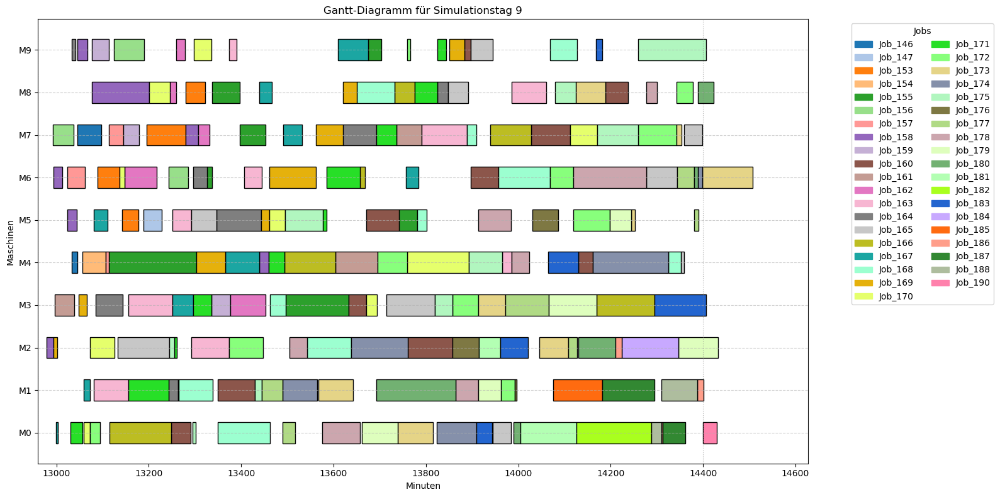


Solver-Status         : FEASIBLE
Objective Value       : 732450.00
Best Objective Bound  : 487060.00
Laufzeit              : 1801.07 Sekunden
Deviation terms       : 487

  Scheduling-Dauer: 30 Minuten und 1.65 Sekunden.


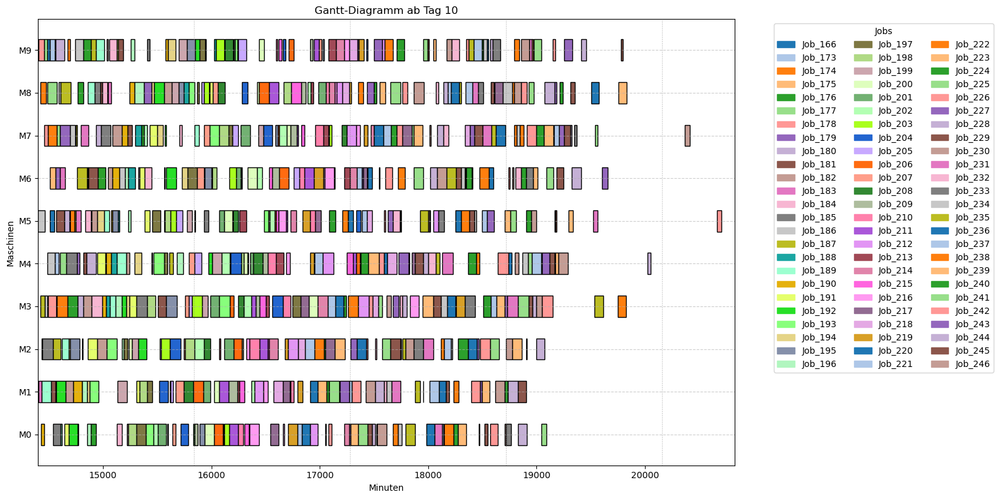

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0         7
0              59
0 - 60          6
60 - 120        0
120 - 180       1
>180            2
Name: count, dtype: int32
[240:02:00] Job_186 started on M5
[240:06:00] Job_183 started on M1
[240:07:00] Job_178 started on M9
[240:23:00] Job_174 started on M8
[240:24:00] Job_187 started on M3
[240:29:00] Job_190 started on M0
[240:33:00] Job_188 started on M2
[240:39:31] Job_188 finished on M2 (after 06 minutes 31 seconds)
[240:40:19] Job_183 finished on M1 (after 34 minutes 19 seconds)
[240:40:19] Job_189 started on M1
[240:42:00] Job_185 started on M2
[240:50:25] Job_178 finished on M9 (after 43 minutes 26 seconds)
[240:55:00] Job_177 started on M9
[240:55:00] Job_178 sta

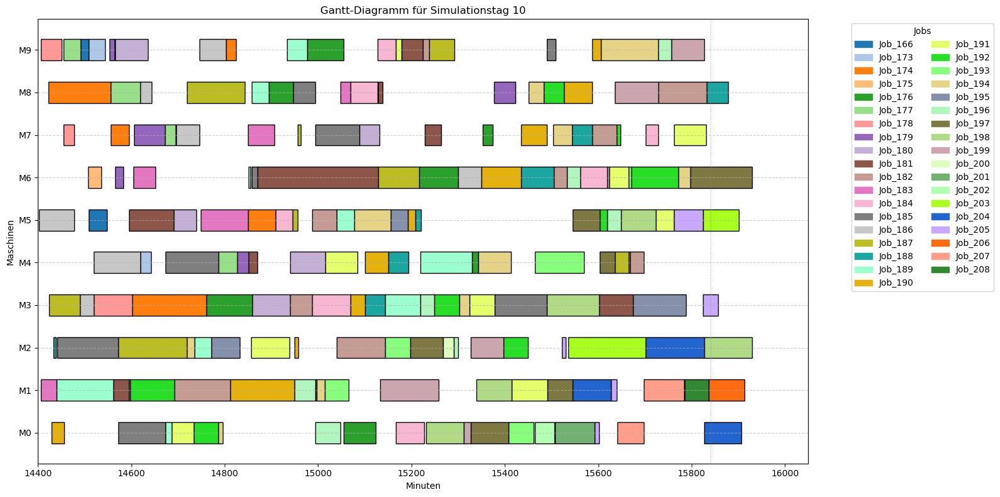


Solver-Status         : FEASIBLE
Objective Value       : 422930.00
Best Objective Bound  : 341210.00
Laufzeit              : 1800.88 Sekunden
Deviation terms       : 485

  Scheduling-Dauer: 30 Minuten und 1.54 Sekunden.


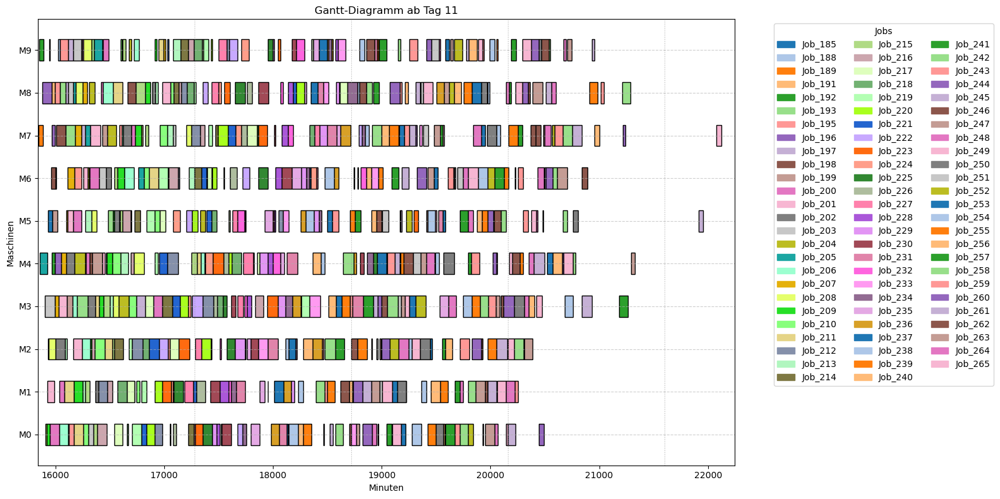

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0         8
0              66
0 - 60          2
60 - 120        0
120 - 180       0
>180            1
Name: count, dtype: int32
[264:03:00] Job_189 started on M7
[264:08:00] Job_192 started on M9
[264:17:00] Job_205 started on M4
[264:38:00] Job_196 started on M8
[264:53:04] Job_192 finished on M9 (after 45 minutes 04 seconds)
[265:01:00] Job_203 started on M3
[265:07:00] Job_208 started on M0
[265:11:52] Job_205 finished on M4 (after 54 minutes 53 seconds)
[265:11:57] Job_189 finished on M7 (after 68 minutes 58 seconds)
[265:14:34] Job_208 finished on M0 (after 07 minutes 34 seconds)
[265:20:00] Job_209 started on M0
[265:24:00] Job_201 started on M1
[265:30:00] Job_207 starte

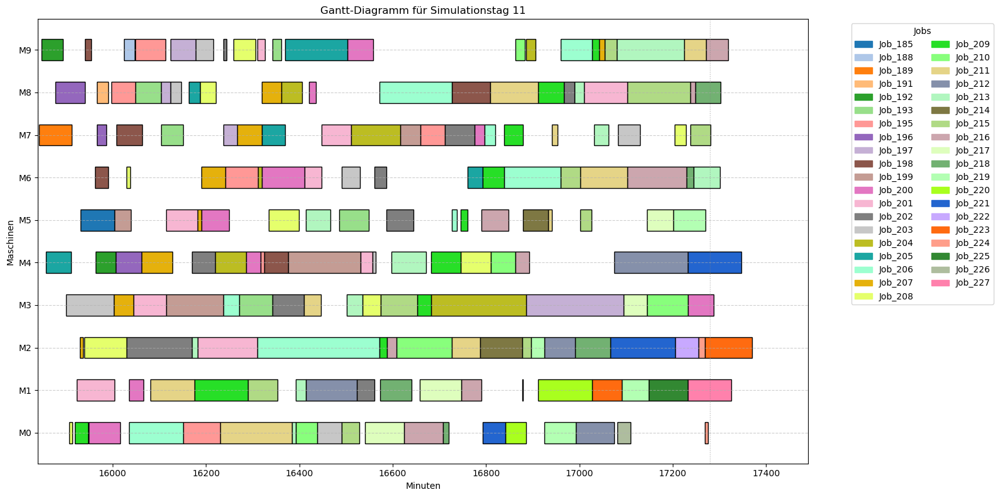


Solver-Status         : FEASIBLE
Objective Value       : 1235240.00
Best Objective Bound  : 893690.00
Laufzeit              : 1801.04 Sekunden
Deviation terms       : 488

  Scheduling-Dauer: 30 Minuten und 1.60 Sekunden.


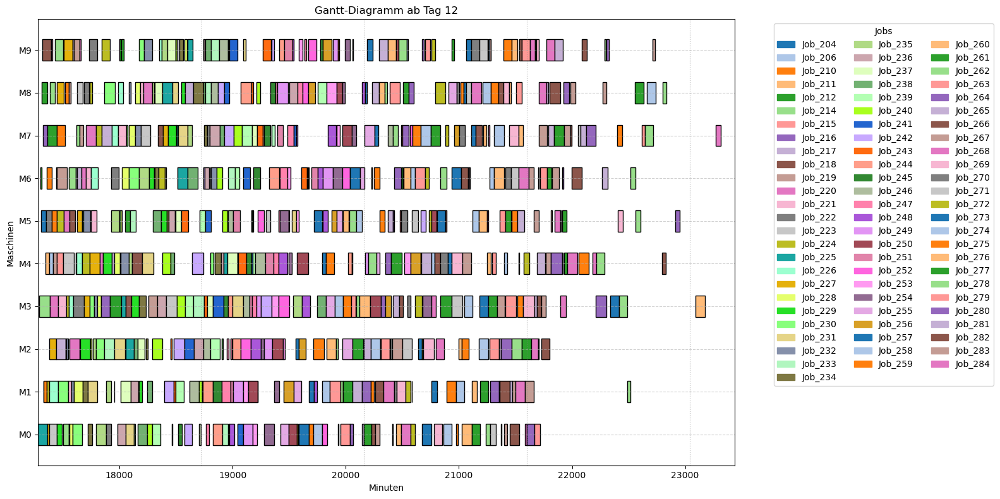

+ Keine Maschinenkonflikte gefunden
+ Alle Jobs wurden in korrekter Operationsreihenfolge ausgeführt.
+ Alle technologischen Abhängigkeiten sind eingehalten.
+ Alle Operation starten erst nach Arrival des Job

+++ Alle Constraints wurden erfüllt.

label
<-180           0
-180 - -120     0
-120 - -60      0
-60 - 0         9
0              59
0 - 60          5
60 - 120        0
120 - 180       2
>180            1
Name: count, dtype: int32
[288:00:00] Job_225 started on M0
[288:08:00] Job_214 started on M3
[288:21:00] Job_212 started on M6
[288:28:00] Job_204 started on M5
[288:31:27] Job_212 finished on M6 (after 10 minutes 27 seconds)
[288:31:27] Job_212 started on M8
[288:40:00] Job_218 started on M9
[288:46:00] Job_216 started on M7
[288:47:00] Job_222 started on M1
[288:49:00] Job_222 finished on M1 (after 02 minutes 01 second)
[288:49:00] Job_210 started on M1
[289:01:00] Job_225 finished on M0 (after 61 minutes)
[289:06:24] Job_204 finished on M5 (after 38 minutes 24 seconds)
[289

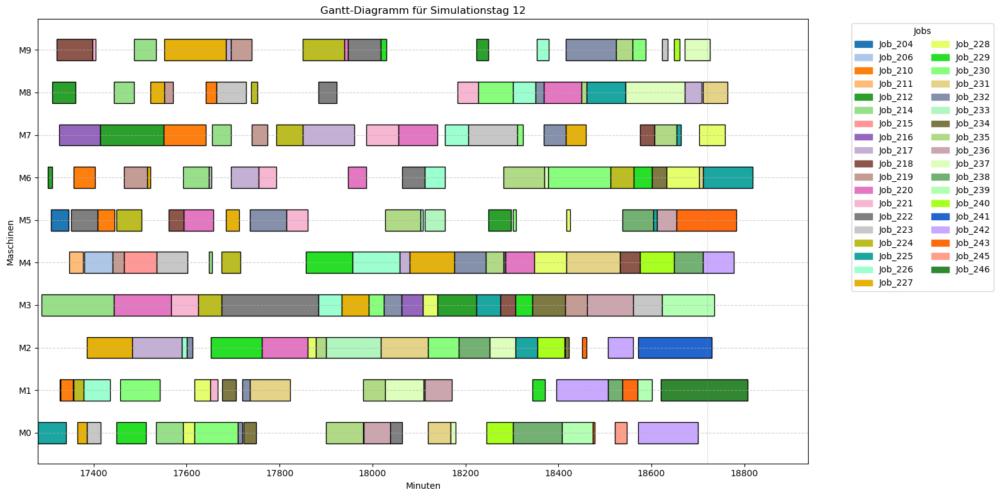

In [34]:
prefix_name = f"{notebook_prefix}_devpen"
first_start = 1
last_planning_start = 12

df_plan = df_plan_init
df_execution = df_execution_init
df_undone = df_undone_init


for day_numb in range(first_start, last_planning_start + 1):
    day_start = day_length * day_numb
    day_end = day_start + day_length
    planning_end = day_start + horizon_days * day_length

    # ------------------- I. Ankunfts- und Operationsvorbereitung -------------------
    df_jssp_curr, df_times_curr = rp_proced.filter_jobs_by_arrival_window(df_times, df_jssp, day_start, planning_end)
    df_jssp_curr = rp_proced.extend_with_undone_operations(df_jssp_curr, df_undone)
    df_times_curr = rp_proced.update_times_after_operation_changes(df_times, df_jssp_curr)

    # ------------------- II. Relevante laufende Operationen -------------------------
    df_execution_important = rp_proced.get_operations_running_into_day(df_execution, day_start)

    # ------------------- III. Rescheduling durchführen -------------------------------

    starting_time = time.time()
    df_plan = solve_cp_jssp_lateness_by_tardiness_and_earliness_with_devpen(df_jssp_curr, df_times_curr, df_execution_important,
                                                                                 df_original_plan = df_plan, # prev. Plan
                                                                                 w_t = 5,
                                                                                 r = 0.70, # 70% Lateness, 30% Deviation
                                                                                 reschedule_start = day_start,
                                                                                 msg=False, timeLimit=max_time, gapRel= 0.05)

    
    solver_duration = time.time() - starting_time
    print(f"\n  Scheduling-Dauer: {int(solver_duration // 60)} Minuten und {(solver_duration % 60):.2f} Sekunden.")

    df_plan.to_csv(get_schedule_filename(prefix_name, day=day_numb), index=False)

    show.plot_gantt_machines(df_plan, title=f"Gantt-Diagramm ab Tag {day_numb}")
    check.check_constraints(df_plan)

    last_ops = df_plan.sort_values(['Job', 'Operation']).drop_duplicates('Job', keep='last')
    print(show.count_column_grouped(last_ops, "Lateness", max_val = 180, steps= 60))

    # ------------------- IV. Einen Tag simulieren -------------------------------------

    simulation = ProductionDaySimulation(df_plan, vc=0.35)
    df_execution, df_undone = simulation.run(start_time=day_start, end_time=day_end)
    if not df_execution.empty:
        show.plot_gantt_machines(df_execution, title=f"Gantt-Diagramm für Simulationstag {day_numb}", duration_column="Simulated Processing Time")
    else:
        print(f"Nothing executed on day {day_numb}")

In [35]:
notebook_duration = time.time() - start_notebook
print(f"Dauer: {int(notebook_duration // 60)} Minuten und {(notebook_duration % 60):.2f} Sekunden.")

Dauer: 369 Minuten und 58.44 Sekunden.
